In [1]:
import tensorflow as tf
config = tf.compat.v1.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.compat.v1.Session(config=config)

/home/team4/anaconda3/envs/gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/team4/anaconda3/envs/gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/team4/anaconda3/envs/gpu/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/team4/anaconda3/envs/gpu/lib/python3.7/site-packages

In [2]:
import keras
import pandas as pd
import tensorflow as tf

import numpy as np
# from keras.models import Sequential, Model
# from keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import np_utils

from tensorflow.keras.models import Sequential, Model
from tensorflow.keras.layers import Dense, Dropout, Activation, Flatten, Convolution2D, MaxPooling2D, GlobalAveragePooling2D, Input,AveragePooling2D, BatchNormalization, LeakyReLU, SpatialDropout2D

# from keras.applications import MobileNet
# from keras.optimizers import Adam
from tensorflow.keras.applications import MobileNetV2, InceptionV3
from tensorflow.keras.optimizers import Adam

from matplotlib import pyplot as plt
import os
from sklearn.model_selection import train_test_split

import seaborn as sns
from sklearn.metrics import recall_score,auc
from sklearn.metrics import precision_score
from sklearn.model_selection import KFold

from collections import defaultdict,Counter
from imblearn.over_sampling import RandomOverSampler
from PIL import Image

from kerastuner import HyperModel

Using TensorFlow backend.


<h2>Data Loading and Preparation</h2>

In [3]:
def getSpeciesCode(x):
    part = x.split('_')
    if part[0] == 'ASETRI':
        return 0
    elif part[0] == 'EPTBOT':
        return 1
    elif part[0] == 'MYOEMA':
        return 2
    elif part[0] == 'PIPKUH':
        return 3
    elif part[0] == 'RHIMUS':
        return 4
    elif part[0] == 'RHYNAS':
        return 5
    elif part[0] == 'ROUAEG':
        return 6
    elif part[0] == 'TAPPER':
        return 7
    else:
        return 'Unknown'
    
def getSpecies(x):
    if x == 0:
        return 'A.tridens'
    elif x == 1:
        return 'E.bottae'
    elif x == 2:
        return 'M.emarginatus'
    elif x == 3:
        return 'P.kuhli'
    elif x == 4:
        return 'R.muscatellum'
    elif x == 5:
        return 'R.nasutus'
    elif x == 6:
        return 'R.aegyptius'
    elif x == 7:
        return 'T.perforatus'
    else:
        return 'Unknown'
    
    
def generate_actual_predicted(Y_pred, X_test, Y_test): 
    predicted = list()
    for i in range(len(Y_pred)):
        predicted.append(np.argmax(Y_pred[i]))
        
    actual = list()
    for i in range(len(Y_test)):
        actual.append(np.argmax(Y_test[i]))
        
    return actual, predicted



# Ytrain in Onehot encoded form 
def makeRandomOverSamples(X_train,Y_train):
    
    Y_train_labelled=[]
    X_dims=X_train.shape

    for i in range(len(Y_train)):
        Y_train_labelled.append(np.argmax(Y_train[i]))

    print('Original training set shape %s' %  [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])       
    X_train= X_train.reshape(-1,X_dims[1]*X_dims[2]*X_dims[3])

    ros = RandomOverSampler(random_state=123)
    X_train, Y_train_labelled = ros.fit_resample(X_train, Y_train_labelled)


    print('Resampled training set shape %s' % [(getSpecies(k),v) for k,v in Counter(Y_train_labelled).items()])


    #reshape X_all
    X_train= X_train.reshape(-1,X_dims[1],X_dims[2],X_dims[3])

    # update Y_train
    Y_train= np_utils.to_categorical(Y_train_labelled, num_classes=8)

    print("After OverSampling\nX_train: shape= ",X_train.shape)
    print("Y_train: shape= ",Y_train.shape)

    
    
    return(X_train,Y_train)

In [4]:
image_folder_path = '../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]
species = []
for file_name in file_paths:
    sp = file_name.split('_')
    species.append(sp[0])

df = pd.DataFrame(species, columns=['Species'])
df['Species'].value_counts()

RHIMUS    1665
TAPPER     403
PIPKUH     299
RHYNAS     269
EPTBOT     124
ROUAEG     121
MYOEMA     112
ASETRI      25
Name: Species, dtype: int64

In [5]:
X_all = []
Y_all = []

image_folder_path = '../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((170, 112))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [6]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 112, 170, 3)
(3018,)


# Evaluation: Utility Functions

In [7]:
# onehot encoded Y_all
def kFold_train(X_all,Y_all, mode_version):
    from sklearn.model_selection import StratifiedKFold
    n_split=10
    n_classes=8

    y_all_labelled=[]
    for i in range(len(Y_all)):
            y_all_labelled.append(np.argmax(Y_all[i]))

    my_callbacks = [tf.keras.callbacks.EarlyStopping(monitor='val_loss',patience=20,verbose=1, mode='min',restore_best_weights=True)]

    count = 1

    for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
        # use the index to generate training an testing sets
        x_train,x_test=X_all[train_index],X_all[test_index]
        y_train,y_test=Y_all[train_index],Y_all[test_index]
        
        
       
        x_train, x_val, y_train, y_val = train_test_split(x_train, y_train, test_size=0.2, random_state = 245, stratify=y_train)
        x_train, y_train= makeRandomOverSamples(x_train, y_train)

        # create and fit the model
        cv_model=build_current_model() # lr,dense,cnn
        history = cv_model.fit(x_train, y_train,
                  batch_size=8,
                  epochs=100,
                  validation_data= (x_val, y_val),
                  verbose=2,
                  callbacks=my_callbacks)


        file_name = mode_version +'_iter_' +str(count)
        
        
                
        #store test index
#         csv_name= mode_version +'_testset_iter_' +str(count)
#         test_index_df = pd.DataFrame(data=test_index,columns=["test_index"])
#         with open(csv_name, mode='w') as f:
#                  test_index_df.to_csv(f)
        #Store History
        hist_df = pd.DataFrame(history.history) 
        hist_json_file = file_name + '.json'

        with open(hist_json_file, mode='w') as f:
            hist_df.to_json(f)
            
            

        model_file = file_name + '.model'
        print(model_file)

        #Save Model
        cv_model.save(model_file) #Save the model

        count+=1

In [8]:
def kFold_test(X_all,Y_all, mode_version):
    from sklearn.metrics import precision_recall_fscore_support
    from sklearn.model_selection import StratifiedKFold
    from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, roc_curve, auc, precision_recall_curve
    from sklearn.metrics import confusion_matrix

    n_split=10
    n_classes=8

    all_base_precision = list()
    all_base_recall = list()
    all_macro_precision = list()
    all_macro_recall = list()
    all_f1 = list()
    all_macro_f1 = list()

    all_tpr = list()
    all_fpr = list()
    all_precision = list()
    all_recall = list()
    all_cm=list()
    all_accuracy = list()

    all_df = list()

    y_all_labelled=[]
    for i in range(len(Y_all)):
            y_all_labelled.append(np.argmax(Y_all[i]))

    count = 1


    for train_index,test_index in StratifiedKFold(n_split, shuffle=True, random_state=123).split(X_all,y_all_labelled):  
        # use the index to generate training an testing sets
        x_train,x_test=X_all[train_index],X_all[test_index]
        y_train,y_test=Y_all[train_index],Y_all[test_index]


        file_name = mode_version +'_iter_' +str(count)
#         csv_name= mode_version +'_testset_iter_' +str(count)
        #Load History 
        hist_json_file = file_name + '.json'
        history_info = pd.read_json(hist_json_file)
        all_df.append(history_info)


        # Load Model
        model_file = file_name + '.model'
        print('File Name Loaded: ',model_file)
        cv_model = tf.keras.models.load_model(model_file) 
        
#         #load test set 
#         testset_file= csv_name
#         testset_df= pd.read_csv (testset_file)
#         test_index=testset_df["test_index"].to_numpy()
       
#         x_test=X_all[test_index]
#         y_test=Y_all[test_index]


        count+=1

        #generate predictions
        y_pred = cv_model.predict(x_test)
        actual, predicted = generate_actual_predicted(y_pred, x_test, y_test)

        #calc metrics
        curr_base_prec, curr_base_rec, curr_f1, _ = precision_recall_fscore_support(actual, predicted)
        curr_macro_prec = precision_score(actual, predicted,average='macro')
        curr_macro_rec = recall_score(actual, predicted,average='macro')
        curr_macro_f1 = f1_score(actual, predicted,average='macro')

        actual_labeled = list()
        predict_labeled = list()
        for x,y in zip(actual,predicted):
            actual_labeled.append(getSpecies(x))
            predict_labeled.append(getSpecies(y))

        labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
        curr_cm=confusion_matrix(actual_labeled,predict_labeled,labels=labels)

        curr_fpr = [0] * n_classes
        curr_tpr = [0] * n_classes
        for i in range(n_classes):
            curr_fpr[i], curr_tpr[i], _ = roc_curve(y_test[:,i], y_pred[:,i])

        curr_prec = [0] * n_classes
        curr_rec = [0] * n_classes
        for i in range(n_classes):
            curr_prec[i], curr_rec[i], _ = precision_recall_curve(y_test[:,i], y_pred[:,i])


        curr_accuracy = accuracy_score(actual, predicted)

        #add to lists
        all_base_precision.append(curr_base_prec)
        all_base_recall.append(curr_base_rec)
        all_macro_precision.append(curr_macro_prec)
        all_macro_recall.append(curr_macro_rec)

        all_f1.append(curr_f1)
        all_macro_f1.append(curr_macro_f1)

        all_accuracy.append(curr_accuracy)


        all_fpr.append(curr_fpr)
        all_tpr.append(curr_tpr)
        all_precision.append(curr_prec)
        all_recall.append(curr_rec)
        all_cm.append(curr_cm)
    kFold_metrics={
            "all_base_precision": all_base_precision ,
            "all_base_recall": all_base_recall,
            "all_macro_precision":all_macro_precision ,
            "all_macro_recall":all_macro_recall ,
            "all_f1":all_f1,
            "all_macro_f1":all_macro_f1 ,
        
            "all_accuracy":all_accuracy ,
            "all_fpr":all_fpr,
            "all_tpr": all_tpr,
            "all_precision":all_precision,
            "all_recall":all_recall,
            "all_cm": all_cm,
            "all_df":all_df
            
        }
    return kFold_metrics




In [9]:
def plot_loss_Accuracy(all_df):
    for df in all_df:
        _, axs = plt.subplots(ncols=2)

        sns.lineplot(data=df['loss'],ax=axs[0], label='Training Loss', legend='brief')
        sns.lineplot(data=df['val_loss'],ax=axs[0], label='Validation Loss', legend='brief')

        sns.lineplot(data=df['acc'],ax=axs[1], label='Training Accuracy', legend='brief')
        sns.lineplot(data=df['val_acc'],ax=axs[1], label='Validation Accuracy', legend='brief')

In [10]:
def print_metrics(KFold_metrics):
    print('precision mean by class', np.array(KFold_metrics.get("all_base_precision")).mean(axis=0))
    print('precision sdev by class', np.array(KFold_metrics.get("all_base_precision")).std(axis=0))

    print('macro precision mean', np.array(KFold_metrics.get("all_macro_precision")).mean())
    print('macro precision sdev', np.array(KFold_metrics.get("all_macro_precision")).std())


    print('recall mean', np.array(KFold_metrics.get("all_base_recall")).mean(axis=0))
    print('recall sdev', np.array(KFold_metrics.get("all_base_recall")).std(axis=0))

    print('macro recall mean', np.array(KFold_metrics.get("all_macro_recall")).mean())
    print('macro recall sdev', np.array(KFold_metrics.get("all_macro_recall")).std())

    print('f1 mean', np.array(KFold_metrics.get("all_f1")).mean(axis=0))
    print('f1 sdev', np.array(KFold_metrics.get("all_f1")).std(axis=0))

    print('macro f1 mean', np.array(KFold_metrics.get("all_macro_f1")).mean())
    print('macro f1 sdev', np.array(KFold_metrics.get("all_macro_f1")).std())

    print('accuracy mean', np.array(KFold_metrics.get("all_accuracy")).mean())
    print('accuracy sdev', np.array(KFold_metrics.get("all_accuracy")).std())



In [11]:
# Plot all K-Fold ROC curves
def plot_ROC(all_fpr,all_tpr,n_split=10, n_classes=8):
    for i in range(n_split):
        _, axs = plt.subplots(ncols=1)
        axs.set(xlabel='False Positive Rate',ylabel='True Positive Rate', title='ROC Curve K-Fold#'+str(i+1))
        for j in range(n_classes):
            auc_val = auc(all_fpr[i][j], all_tpr[i][j])
            auc_val = np.around(auc_val,4)
            sns.lineplot(x=all_fpr[i][j],y=all_tpr[i][j],ax=axs, label='Class '+ getSpecies(j) +' (area = ' + str(auc_val) + ')', legend='brief')


In [12]:
def print_meanAUC(all_fpr,all_tpr,n_split=10, n_classes=8):
    aucs = list()

    for i in range(n_classes):
        aucs.append(list())


    for i in range(n_split):
        for j in range(n_classes):
            auc_val = auc(all_fpr[i][j], all_tpr[i][j])
            aucs[j].append(auc_val)

    for i in range(n_classes):
        print("Sp: ", getSpecies(i))
        print("AUC Mean ", np.array(aucs[i]).mean())
        print("Std ", np.array(aucs[i]).std())

In [13]:
#Plot all K-Fold Precision/Recall curves
def plot_precision_recall(all_recall,all_precision,n_split=10, n_classes=8):
    for i in range(n_split):
        _, axs = plt.subplots(ncols=1)
        axs.set(xlabel='Recall',ylabel='Precision', title='Precision/Recall Curve K-Fold#'+str(i+1))
        for j in range(n_classes):
            sns.lineplot(x=all_recall[i][j],y=all_precision[i][j],ax=axs, label='Class '+ getSpecies(j), legend='brief')

In [14]:
def plot_confusion_matrices_per_iter(all_cm,n_split=10, n_classes=8):
    ## Plot all K-Fold confusion matrices
    import numpy as np
    import matplotlib.pylab as pl
    import matplotlib.gridspec as gridspec
    from matplotlib import pyplot as plt
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
        
    # Create 1X 5 sub plots
    # gs = gridspec.GridSpec(1,n_split)
    figs=[]
    for i in range(n_split):
        figs.append(plt.figure())

    for i in range(n_split):
        print('Confusion Matrix K-Fold #'+ str(i+1)+"\n")
        print(all_cm[i])
        print("\n")

        ax=figs[i].add_subplot()
        sns.heatmap(all_cm[i], annot=True, ax = ax); #annot=True to annotate cells


        # labels, title and ticks
        ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
        ax.set_title('Confusion Matrix K-Fold #'+ str(i+1)); 
        ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

In [15]:
def  plot_macro_confusion_matrices(all_cm,n_split=10, n_classes=8):
    ## plot macro cm
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
        
    sum_all_cm=np.zeros((n_classes,n_classes)).astype('int64')
    for i in range(n_split):
        sum_all_cm+=all_cm[i]


    #plot 
    figs=[]
    for i in range(2):
        figs.append(plt.figure())

    print("sum of all confuion matrices\n",sum_all_cm)
    ax=figs[0].add_subplot()
    sns.heatmap(sum_all_cm, annot=True, ax = ax);

    avg_all_cm=np.divide(sum_all_cm,n_split).astype('int64')
    print("\naverage of all confuion matrices\n",avg_all_cm)
    ax=figs[1].add_subplot()
    sns.heatmap(avg_all_cm, annot=True, ax = ax);
    return sum_all_cm, avg_all_cm

In [16]:
 def plot_normalised_confusion_matrix( sum_all_cm, avg_all_cm, n_split=10, n_classes=8):
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']
        

    cm= sum_all_cm/ sum_all_cm.astype(np.float).sum(axis=1,keepdims = True)
    cm = (np.around(cm,2))
    print(cm)


    labels = ['A.tridens','E.bottae','M.emarginatus','P.kuhli','R.muscatellum','R.nasutus', 'R.aegyptius', 'T.perforatus']


    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells

    # labels, title and ticks
    ax.set_xlabel('Predicted labels');ax.set_ylabel('True labels'); 
    ax.set_title('Confusion Matrix'); 
    ax.xaxis.set_ticklabels(labels,rotation=45); ax.yaxis.set_ticklabels(labels,rotation=45);

### Load and Evaluate



## V1 !!!!! K-Fold Training and Evaluation


In [19]:
folder = "models"
mode_version = "spec_RO_v1"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v1


In [20]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=16,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=64,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [21]:
model = build_current_model()
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 16)        2368      
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 16)        64        
_________________________________________________________________
activation (Activation)      (None, 56, 85, 16)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 16)        0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 16)        0         
_________

In [23]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 7s - loss: 1.8577 - acc: 0.2861 - val_loss: 1.2109 - val_acc: 0.5404
Epoch 2/100
9592/9592 - 7s - loss: 1.4359 - acc: 0.4716 - val_loss: 1.7413 - val_acc: 0.2261
Epoch 3/100
9592/9592 - 7s - loss: 1.0377 - acc: 0.6402 - val_loss: 1.0090 - val_acc: 0.6103
Epoch 4/100
9592/9592 - 7s - loss: 0.8122 - acc: 0.7222 - val_loss: 1.1397 - val_acc: 0.5643
Epoch 5/100
9592/9592 - 7s - loss: 0.6725 - acc: 0.7754 - val_loss: 0.5724 - val_acc: 0.7610
E

Epoch 41/100
9592/9592 - 8s - loss: 0.1189 - acc: 0.9640 - val_loss: 0.2973 - val_acc: 0.9099
Epoch 42/100
9592/9592 - 9s - loss: 0.1196 - acc: 0.9600 - val_loss: 0.3483 - val_acc: 0.8897
Epoch 43/100
9592/9592 - 8s - loss: 0.0995 - acc: 0.9677 - val_loss: 0.1636 - val_acc: 0.9504
Epoch 44/100
9592/9592 - 9s - loss: 0.1081 - acc: 0.9655 - val_loss: 0.2485 - val_acc: 0.9283
Epoch 45/100
9592/9592 - 9s - loss: 0.1039 - acc: 0.9665 - val_loss: 0.2530 - val_acc: 0.9338
Epoch 46/100
9592/9592 - 9s - loss: 0.1110 - acc: 0.9683 - val_loss: 0.1906 - val_acc: 0.9357
Epoch 47/100
9592/9592 - 9s - loss: 0.1041 - acc: 0.9685 - val_loss: 0.1464 - val_acc: 0.9559
Epoch 48/100
9592/9592 - 8s - loss: 0.1084 - acc: 0.9667 - val_loss: 0.1763 - val_acc: 0.9485
Epoch 49/100
9592/9592 - 8s - loss: 0.1035 - acc: 0.9681 - val_loss: 0.1720 - val_acc: 0.9467
Epoch 50/100
9592/9592 - 9s - loss: 0.0977 - acc: 0.9699 - val_loss: 0.1646 - val_acc: 0.9393
Epoch 51/100
9592/9592 - 9s - loss: 0.0884 - acc: 0.9746 - v

Epoch 9/100
9584/9584 - 7s - loss: 0.3898 - acc: 0.8741 - val_loss: 0.3301 - val_acc: 0.8768
Epoch 10/100
9584/9584 - 7s - loss: 0.3699 - acc: 0.8819 - val_loss: 0.4571 - val_acc: 0.8438
Epoch 11/100
9584/9584 - 7s - loss: 0.3371 - acc: 0.8896 - val_loss: 0.3429 - val_acc: 0.8750
Epoch 12/100
9584/9584 - 7s - loss: 0.3024 - acc: 0.9008 - val_loss: 0.3713 - val_acc: 0.8787
Epoch 13/100
9584/9584 - 7s - loss: 0.2685 - acc: 0.9115 - val_loss: 0.3934 - val_acc: 0.8695
Epoch 14/100
9584/9584 - 7s - loss: 0.2582 - acc: 0.9141 - val_loss: 0.2709 - val_acc: 0.9062
Epoch 15/100
9584/9584 - 7s - loss: 0.2420 - acc: 0.9228 - val_loss: 0.3317 - val_acc: 0.8989
Epoch 16/100
9584/9584 - 7s - loss: 0.2254 - acc: 0.9274 - val_loss: 0.6692 - val_acc: 0.7739
Epoch 17/100
9584/9584 - 7s - loss: 0.2152 - acc: 0.9332 - val_loss: 0.4967 - val_acc: 0.8493
Epoch 18/100
9584/9584 - 7s - loss: 0.2114 - acc: 0.9350 - val_loss: 0.3754 - val_acc: 0.8879
Epoch 19/100
9584/9584 - 7s - loss: 0.1940 - acc: 0.9389 - va

Epoch 18/100
9584/9584 - 9s - loss: 0.2204 - acc: 0.9269 - val_loss: 0.6960 - val_acc: 0.8033
Epoch 19/100
9584/9584 - 8s - loss: 0.2189 - acc: 0.9327 - val_loss: 0.4709 - val_acc: 0.8493
Epoch 20/100
9584/9584 - 9s - loss: 0.1926 - acc: 0.9388 - val_loss: 0.3867 - val_acc: 0.8805
Epoch 21/100
9584/9584 - 9s - loss: 0.1957 - acc: 0.9379 - val_loss: 0.2282 - val_acc: 0.9228
Epoch 22/100
9584/9584 - 9s - loss: 0.1963 - acc: 0.9391 - val_loss: 0.3166 - val_acc: 0.9044
Epoch 23/100
9584/9584 - 9s - loss: 0.1709 - acc: 0.9464 - val_loss: 0.3067 - val_acc: 0.9191
Epoch 24/100
9584/9584 - 9s - loss: 0.1643 - acc: 0.9464 - val_loss: 0.2367 - val_acc: 0.9393
Epoch 25/100
9584/9584 - 10s - loss: 0.1789 - acc: 0.9437 - val_loss: 0.2469 - val_acc: 0.9265
Epoch 26/100
9584/9584 - 10s - loss: 0.1666 - acc: 0.9495 - val_loss: 0.1964 - val_acc: 0.9504
Epoch 27/100
9584/9584 - 9s - loss: 0.1530 - acc: 0.9517 - val_loss: 0.2543 - val_acc: 0.9283
Epoch 28/100
9584/9584 - 9s - loss: 0.1494 - acc: 0.9542 -

Epoch 40/100
9584/9584 - 10s - loss: 0.1029 - acc: 0.9657 - val_loss: 0.4021 - val_acc: 0.8989
Epoch 41/100
9584/9584 - 10s - loss: 0.0917 - acc: 0.9729 - val_loss: 0.2643 - val_acc: 0.9375
Epoch 42/100
9584/9584 - 9s - loss: 0.1195 - acc: 0.9670 - val_loss: 0.3851 - val_acc: 0.8860
Epoch 43/100
9584/9584 - 9s - loss: 0.0972 - acc: 0.9704 - val_loss: 0.2648 - val_acc: 0.9320
Epoch 44/100
9584/9584 - 10s - loss: 0.0960 - acc: 0.9715 - val_loss: 0.2499 - val_acc: 0.9320
Epoch 45/100
9584/9584 - 10s - loss: 0.0979 - acc: 0.9698 - val_loss: 0.2643 - val_acc: 0.9283
Epoch 46/100
9584/9584 - 9s - loss: 0.0959 - acc: 0.9706 - val_loss: 0.3455 - val_acc: 0.9118
Epoch 47/100
Restoring model weights from the end of the best epoch.
9584/9584 - 10s - loss: 0.0965 - acc: 0.9717 - val_loss: 0.2375 - val_acc: 0.9412
Epoch 00047: early stopping
models/spec_RO_v1_iter_7.model
Original training set shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 

Epoch 7/100
9592/9592 - 10s - loss: 0.4908 - acc: 0.8388 - val_loss: 0.2947 - val_acc: 0.8971
Epoch 8/100
9592/9592 - 10s - loss: 0.4537 - acc: 0.8551 - val_loss: 0.3511 - val_acc: 0.8934
Epoch 9/100
9592/9592 - 10s - loss: 0.3894 - acc: 0.8734 - val_loss: 0.3714 - val_acc: 0.8585
Epoch 10/100
9592/9592 - 11s - loss: 0.3570 - acc: 0.8839 - val_loss: 0.2393 - val_acc: 0.9265
Epoch 11/100
9592/9592 - 10s - loss: 0.3173 - acc: 0.8961 - val_loss: 0.7788 - val_acc: 0.7776
Epoch 12/100
9592/9592 - 11s - loss: 0.3151 - acc: 0.9017 - val_loss: 0.3144 - val_acc: 0.9062
Epoch 13/100
9592/9592 - 10s - loss: 0.2926 - acc: 0.9042 - val_loss: 0.2257 - val_acc: 0.9357
Epoch 14/100
9592/9592 - 10s - loss: 0.2691 - acc: 0.9144 - val_loss: 0.2735 - val_acc: 0.9283
Epoch 15/100
9592/9592 - 10s - loss: 0.2544 - acc: 0.9195 - val_loss: 0.5674 - val_acc: 0.8033
Epoch 16/100
9592/9592 - 11s - loss: 0.2462 - acc: 0.9176 - val_loss: 0.2215 - val_acc: 0.9320
Epoch 17/100
9592/9592 - 10s - loss: 0.2344 - acc: 0.

Epoch 25/100
9592/9592 - 13s - loss: 0.1646 - acc: 0.9484 - val_loss: 0.4255 - val_acc: 0.8676
Epoch 26/100
9592/9592 - 13s - loss: 0.1532 - acc: 0.9535 - val_loss: 0.2054 - val_acc: 0.9301
Epoch 27/100
9592/9592 - 13s - loss: 0.1396 - acc: 0.9554 - val_loss: 0.2628 - val_acc: 0.9191
Epoch 28/100
9592/9592 - 13s - loss: 0.1474 - acc: 0.9541 - val_loss: 0.2073 - val_acc: 0.9301
Epoch 29/100
9592/9592 - 13s - loss: 0.1458 - acc: 0.9542 - val_loss: 0.3486 - val_acc: 0.8879
Epoch 30/100
9592/9592 - 14s - loss: 0.1350 - acc: 0.9544 - val_loss: 0.3867 - val_acc: 0.8658
Epoch 31/100
9592/9592 - 13s - loss: 0.1378 - acc: 0.9580 - val_loss: 0.4408 - val_acc: 0.8621
Epoch 32/100
9592/9592 - 13s - loss: 0.1333 - acc: 0.9579 - val_loss: 0.4662 - val_acc: 0.8713
Epoch 33/100
9592/9592 - 13s - loss: 0.1392 - acc: 0.9588 - val_loss: 0.2655 - val_acc: 0.9173
Epoch 34/100
9592/9592 - 14s - loss: 0.1210 - acc: 0.9638 - val_loss: 0.2368 - val_acc: 0.9228
Epoch 35/100
9592/9592 - 13s - loss: 0.1202 - acc:

In [26]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v1_iter_1.model
File Name Loaded:  models/spec_RO_v1_iter_2.model
File Name Loaded:  models/spec_RO_v1_iter_3.model
File Name Loaded:  models/spec_RO_v1_iter_4.model
File Name Loaded:  models/spec_RO_v1_iter_5.model
File Name Loaded:  models/spec_RO_v1_iter_6.model
File Name Loaded:  models/spec_RO_v1_iter_7.model
File Name Loaded:  models/spec_RO_v1_iter_8.model
File Name Loaded:  models/spec_RO_v1_iter_9.model
File Name Loaded:  models/spec_RO_v1_iter_10.model


In [ ]:
# all_df=[]
# for i in range(10):
    
#      #Load History 
#         hist_json_file =  mode_version +'_iter_' +str(i+1) + '.json'
#         history_info = pd.read_json(hist_json_file)
#         all_df.append(history_info)
# print (all_df[99])
# plot_loss_Accuracy(all_df)

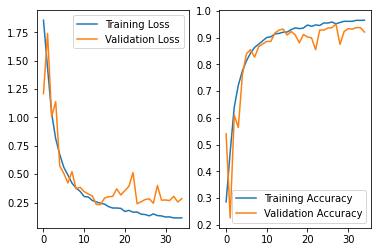

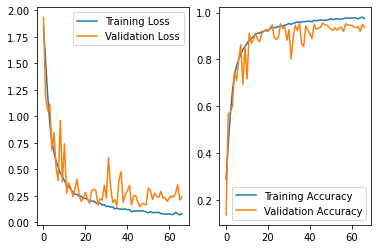

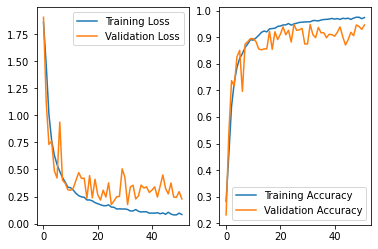

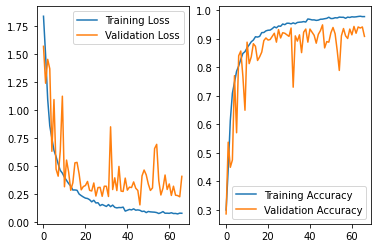

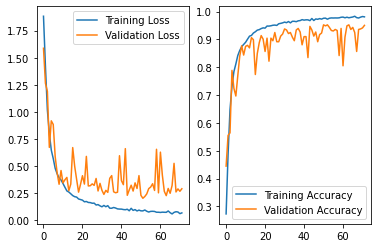

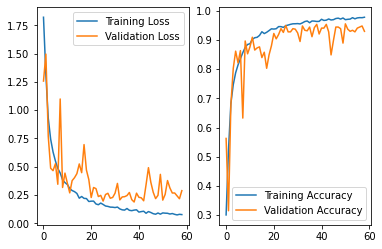

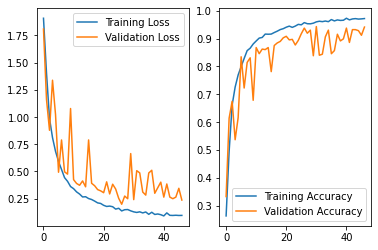

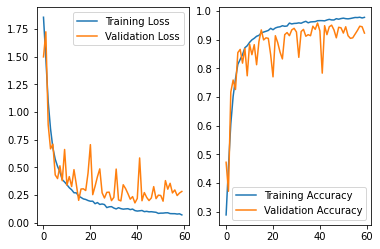

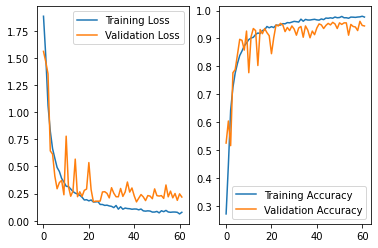

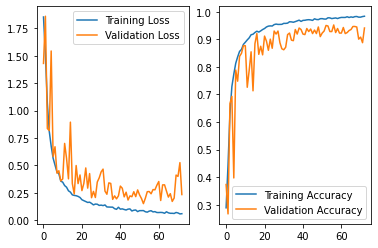

In [27]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [28]:
print_metrics(kFold_metrics)


precision mean by class [1.         0.91512155 0.91011544 0.90951756 0.98407716 0.94023354
 0.72671919 0.92396401]
precision sdev by class [0.         0.06892091 0.09154023 0.05488339 0.00406785 0.04022358
 0.08059381 0.04367519]
macro precision mean 0.9137185558799651
macro precision sdev 0.017732809143408287
recall mean [0.88333333 0.91923077 0.80378788 0.9262069  0.96515403 0.89957265
 0.90064103 0.96280488]
recall sdev [0.23629078 0.07179487 0.0664295  0.04956889 0.00965887 0.05261504
 0.11677404 0.01664087]
macro recall mean 0.9075914325571223
macro recall sdev 0.028770252013419883
f1 mean [0.91666667 0.91594732 0.84981366 0.91577761 0.9745003  0.91806215
 0.79456044 0.9421735 ]
f1 sdev [0.17078251 0.06194585 0.05588123 0.03041989 0.00577302 0.03194157
 0.05423188 0.01992415]
macro f1 mean 0.9034377072613997
macro f1 sdev 0.023602010185351473
accuracy mean 0.9439935314954567
accuracy sdev 0.009714200500490603


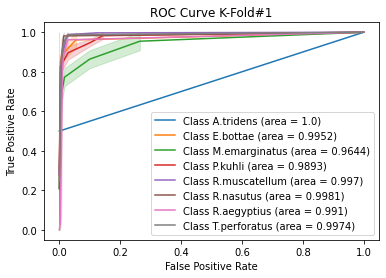

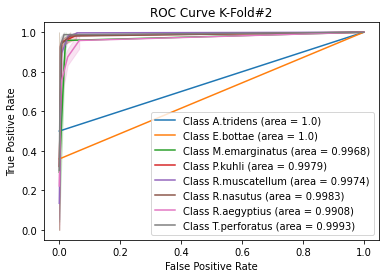

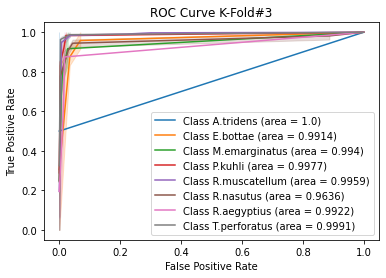

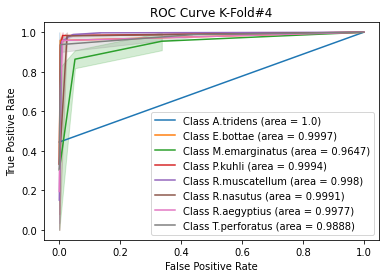

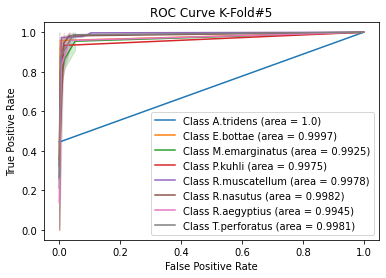

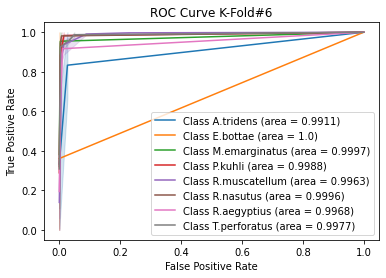

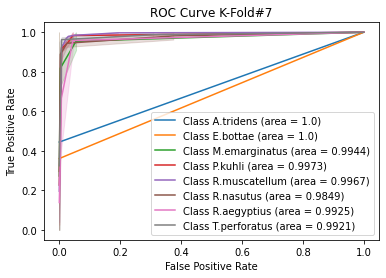

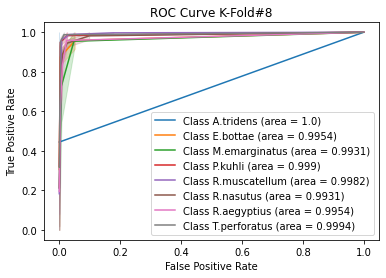

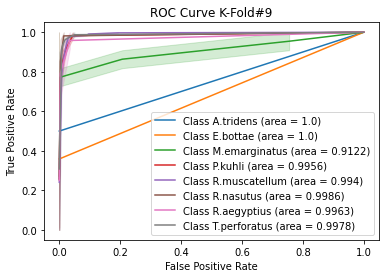

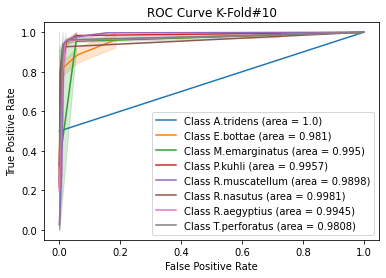

In [29]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [30]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.9991081382385729
Std  0.0026755852842809463
Sp:  E.bottae
AUC Mean  0.996245216464388
Std  0.005806991485830697
Sp:  M.emarginatus
AUC Mean  0.9806793135765763
Std  0.02587027600487357
Sp:  P.kuhli
AUC Mean  0.9968153071641999
Std  0.0027904269252155504
Sp:  R.muscatellum
AUC Mean  0.9961238350922377
Std  0.0024015740410367322
Sp:  R.nasutus
AUC Mean  0.993178397586522
Std  0.010712422957366026
Sp:  R.aegyptius
AUC Mean  0.9941780477208827
Std  0.0023196989032285217
Sp:  T.perforatus
AUC Mean  0.9950486221234941
Std  0.005757955849569702


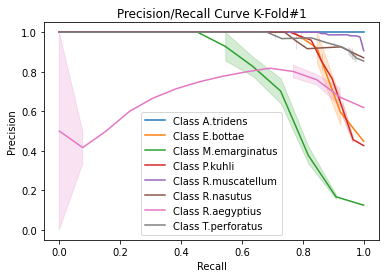

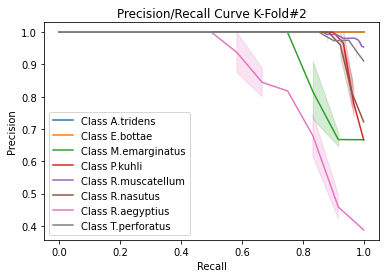

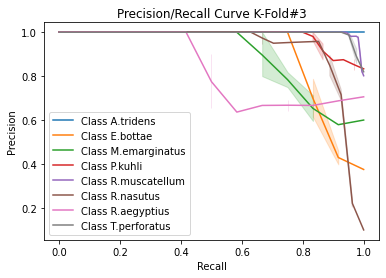

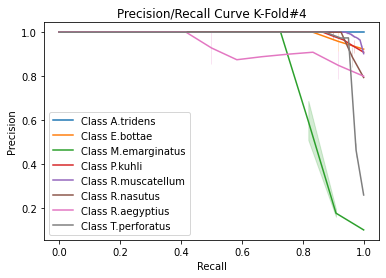

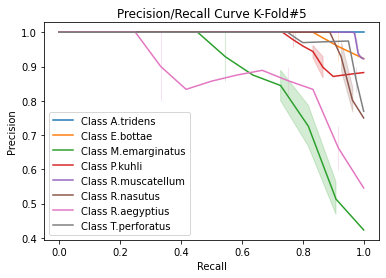

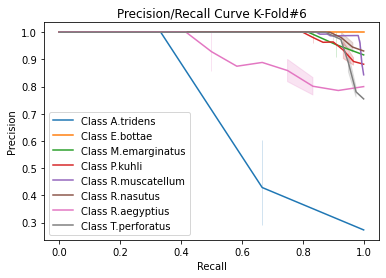

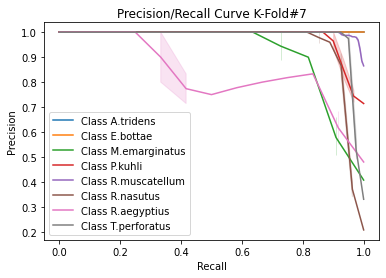

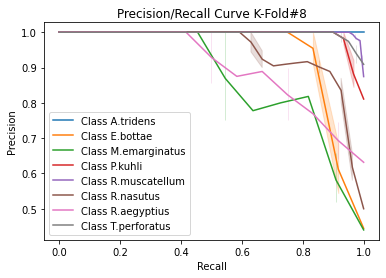

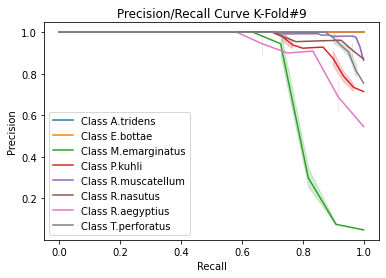

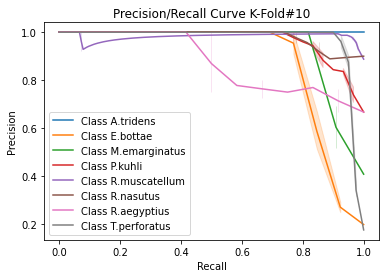

In [31]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  1   0   0   0   0   0   1   0]
 [  0  11   0   0   0   2   0   0]
 [  0   0   8   1   0   0   2   0]
 [  0   0   1  25   2   0   1   0]
 [  0   0   0   1 162   0   0   3]
 [  0   0   0   1   0  25   1   0]
 [  0   1   0   0   0   0  12   0]
 [  0   0   1   0   1   0   0  39]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0  10   0   0   0   2   0]
 [  0   0   1  28   1   0   0   0]
 [  0   0   0   0 161   0   2   3]
 [  0   0   0   1   1  23   1   0]
 [  0   0   0   0   1   0  10   1]
 [  0   0   0   0   0   0   1  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   9   0   1   0   2   0]
 [  0   0   0  29   1   0   0   0]
 [  0   1   0   4 159   0   2   0]
 [  0   1   0   0   0  24   2   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   1   0   1  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

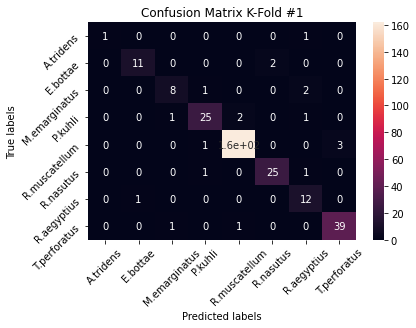

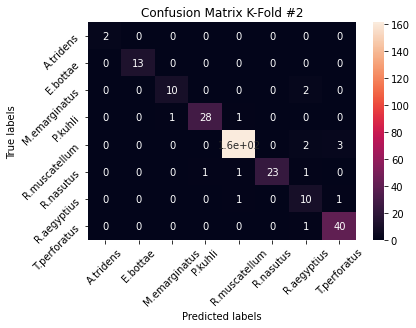

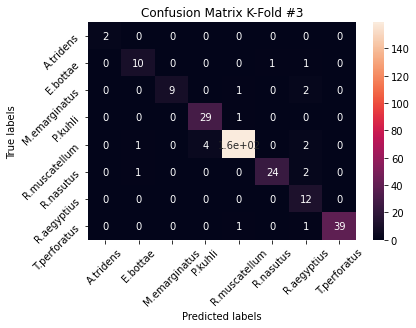

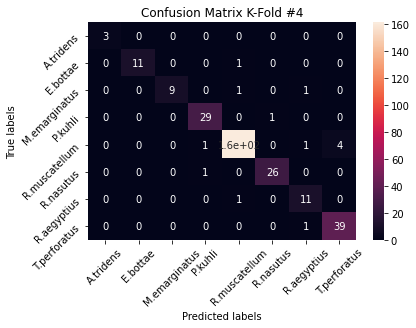

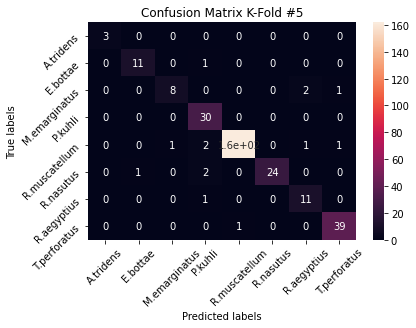

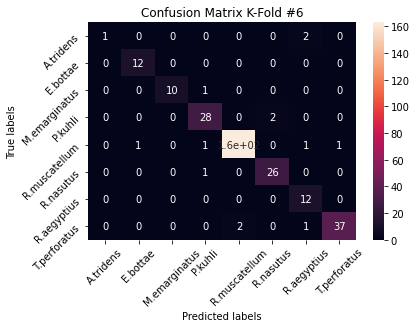

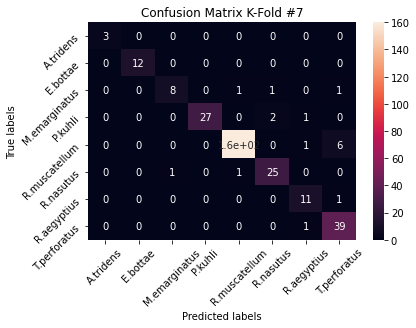

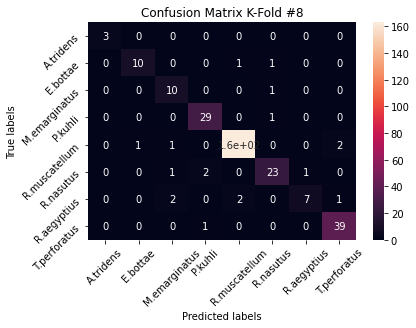

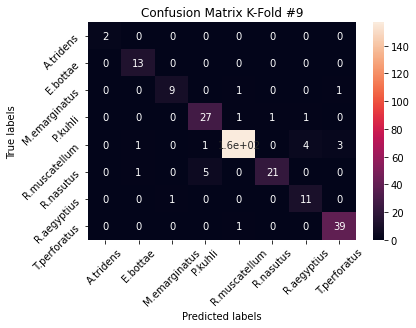

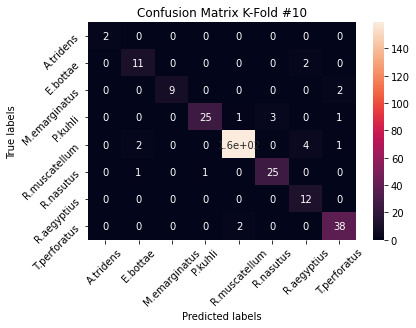

In [32]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  22    0    0    0    0    0    3    0]
 [   0  114    0    1    2    4    3    0]
 [   0    0   90    2    4    2    9    5]
 [   0    0    2  277    6   10    3    1]
 [   0    6    2   10 1607    0   16   24]
 [   0    4    2   14    2  242    5    0]
 [   0    1    3    1    4    0  109    3]
 [   0    0    1    1    8    0    5  388]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   9   0   0   0   0   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   1 160   0   1   2]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   0   0   0  38]]


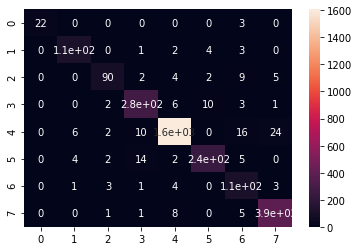

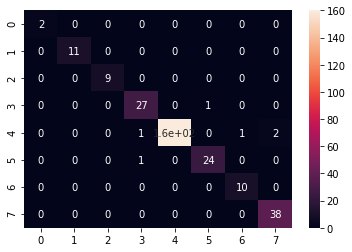

In [33]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.88 0.   0.   0.   0.   0.   0.12 0.  ]
 [0.   0.92 0.   0.01 0.02 0.03 0.02 0.  ]
 [0.   0.   0.8  0.02 0.04 0.02 0.08 0.04]
 [0.   0.   0.01 0.93 0.02 0.03 0.01 0.  ]
 [0.   0.   0.   0.01 0.97 0.   0.01 0.01]
 [0.   0.01 0.01 0.05 0.01 0.9  0.02 0.  ]
 [0.   0.01 0.02 0.01 0.03 0.   0.9  0.02]
 [0.   0.   0.   0.   0.02 0.   0.01 0.96]]


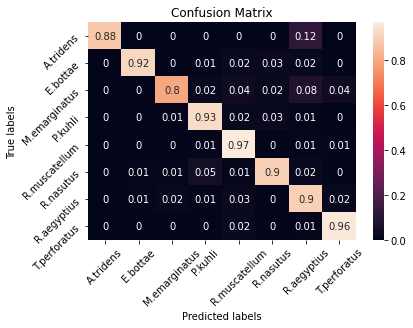

In [34]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)

<h2> V2 !!!!! K-Fold Training and Evaluation</h2>

In [35]:
folder = "models"
mode_version = "spec_RO_v2"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v2


In [36]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=24,kernel_size=(5,5),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=56,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=136,kernel_size=(7,7),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=120,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(512)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.4)(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.3)(lay)

    lay = Dense(128)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.2)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [37]:
model = build_current_model()
model.summary()


Model: "model_12"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_13 (InputLayer)        [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d_48 (Conv2D)           (None, 56, 85, 24)        1824      
_________________________________________________________________
batch_normalization_84 (Batc (None, 56, 85, 24)        96        
_________________________________________________________________
activation_84 (Activation)   (None, 56, 85, 24)        0         
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 28, 43, 24)        0         
_________________________________________________________________
spatial_dropout2d_48 (Spatia (None, 28, 43, 24)        0         
_________________________________________________________________
conv2d_49 (Conv2D)           (None, 14, 22, 56)        336

In [38]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 16s - loss: 1.8802 - acc: 0.2863 - val_loss: 1.7857 - val_acc: 0.5055
Epoch 2/100
9592/9592 - 14s - loss: 1.2865 - acc: 0.5298 - val_loss: 1.0721 - val_acc: 0.5882
Epoch 3/100
9592/9592 - 13s - loss: 0.9083 - acc: 0.6865 - val_loss: 0.9604 - val_acc: 0.6691
Epoch 4/100
9592/9592 - 13s - loss: 0.7101 - acc: 0.7618 - val_loss: 0.8551 - val_acc: 0.7188
Epoch 5/100
9592/9592 - 13s - loss: 0.5657 - acc: 0.8101 - val_loss: 0.5331 - val_acc: 0.8

Epoch 26/100
9592/9592 - 9s - loss: 0.0976 - acc: 0.9701 - val_loss: 0.3018 - val_acc: 0.9136
Epoch 27/100
9592/9592 - 9s - loss: 0.1060 - acc: 0.9658 - val_loss: 0.4669 - val_acc: 0.8695
Epoch 28/100
9592/9592 - 9s - loss: 0.1023 - acc: 0.9679 - val_loss: 0.2335 - val_acc: 0.9228
Epoch 29/100
9592/9592 - 10s - loss: 0.0933 - acc: 0.9719 - val_loss: 0.2447 - val_acc: 0.9320
Epoch 30/100
9592/9592 - 9s - loss: 0.0847 - acc: 0.9753 - val_loss: 0.3002 - val_acc: 0.9191
Epoch 31/100
9592/9592 - 9s - loss: 0.0866 - acc: 0.9741 - val_loss: 0.3040 - val_acc: 0.9283
Epoch 32/100
9592/9592 - 9s - loss: 0.1030 - acc: 0.9675 - val_loss: 0.3379 - val_acc: 0.9173
Epoch 33/100
9592/9592 - 9s - loss: 0.0892 - acc: 0.9733 - val_loss: 0.3816 - val_acc: 0.8934
Epoch 34/100
9592/9592 - 9s - loss: 0.0734 - acc: 0.9768 - val_loss: 0.3229 - val_acc: 0.9228
Epoch 35/100
9592/9592 - 9s - loss: 0.0895 - acc: 0.9719 - val_loss: 0.3469 - val_acc: 0.9062
Epoch 36/100
9592/9592 - 9s - loss: 0.0851 - acc: 0.9731 - 

Epoch 19/100
9584/9584 - 9s - loss: 0.1461 - acc: 0.9518 - val_loss: 0.3306 - val_acc: 0.9026
Epoch 20/100
9584/9584 - 8s - loss: 0.1371 - acc: 0.9575 - val_loss: 0.3048 - val_acc: 0.9173
Epoch 21/100
9584/9584 - 9s - loss: 0.1380 - acc: 0.9554 - val_loss: 0.5554 - val_acc: 0.8438
Epoch 22/100
9584/9584 - 9s - loss: 0.1221 - acc: 0.9628 - val_loss: 0.3067 - val_acc: 0.9026
Epoch 23/100
9584/9584 - 9s - loss: 0.1247 - acc: 0.9593 - val_loss: 0.3172 - val_acc: 0.9118
Epoch 24/100
9584/9584 - 9s - loss: 0.1128 - acc: 0.9650 - val_loss: 0.5291 - val_acc: 0.8346
Epoch 25/100
9584/9584 - 9s - loss: 0.1098 - acc: 0.9689 - val_loss: 0.2534 - val_acc: 0.9246
Epoch 26/100
9584/9584 - 9s - loss: 0.1104 - acc: 0.9662 - val_loss: 0.2537 - val_acc: 0.9118
Epoch 27/100
9584/9584 - 9s - loss: 0.0975 - acc: 0.9708 - val_loss: 0.2680 - val_acc: 0.9301
Epoch 28/100
9584/9584 - 8s - loss: 0.1015 - acc: 0.9671 - val_loss: 0.2967 - val_acc: 0.9301
Epoch 29/100
9584/9584 - 8s - loss: 0.1006 - acc: 0.9680 - v

Epoch 5/100
9584/9584 - 10s - loss: 0.5867 - acc: 0.8031 - val_loss: 1.1576 - val_acc: 0.6324
Epoch 6/100
9584/9584 - 10s - loss: 0.4741 - acc: 0.8471 - val_loss: 0.6784 - val_acc: 0.7537
Epoch 7/100
9584/9584 - 10s - loss: 0.3938 - acc: 0.8708 - val_loss: 0.5279 - val_acc: 0.8438
Epoch 8/100
9584/9584 - 10s - loss: 0.3401 - acc: 0.8884 - val_loss: 0.4408 - val_acc: 0.8548
Epoch 9/100
9584/9584 - 10s - loss: 0.2829 - acc: 0.9086 - val_loss: 0.3505 - val_acc: 0.8842
Epoch 10/100
9584/9584 - 10s - loss: 0.2709 - acc: 0.9131 - val_loss: 0.5594 - val_acc: 0.8272
Epoch 11/100
9584/9584 - 11s - loss: 0.2491 - acc: 0.9175 - val_loss: 0.4776 - val_acc: 0.8529
Epoch 12/100
9584/9584 - 10s - loss: 0.2223 - acc: 0.9277 - val_loss: 0.3596 - val_acc: 0.8750
Epoch 13/100
9584/9584 - 10s - loss: 0.2001 - acc: 0.9316 - val_loss: 0.3050 - val_acc: 0.9136
Epoch 14/100
9584/9584 - 11s - loss: 0.1902 - acc: 0.9394 - val_loss: 0.3825 - val_acc: 0.8750
Epoch 15/100
9584/9584 - 10s - loss: 0.1718 - acc: 0.94

Epoch 32/100
9584/9584 - 9s - loss: 0.0947 - acc: 0.9703 - val_loss: 0.3417 - val_acc: 0.9044
Epoch 33/100
9584/9584 - 10s - loss: 0.0724 - acc: 0.9784 - val_loss: 0.2024 - val_acc: 0.9430
Epoch 34/100
9584/9584 - 10s - loss: 0.0856 - acc: 0.9737 - val_loss: 0.3272 - val_acc: 0.9301
Epoch 35/100
9584/9584 - 9s - loss: 0.0788 - acc: 0.9758 - val_loss: 0.2916 - val_acc: 0.9320
Epoch 36/100
9584/9584 - 9s - loss: 0.0732 - acc: 0.9774 - val_loss: 0.3744 - val_acc: 0.9081
Epoch 37/100
9584/9584 - 10s - loss: 0.0722 - acc: 0.9783 - val_loss: 0.2316 - val_acc: 0.9504
Epoch 38/100
9584/9584 - 9s - loss: 0.0657 - acc: 0.9797 - val_loss: 0.2569 - val_acc: 0.9467
Epoch 39/100
9584/9584 - 10s - loss: 0.0560 - acc: 0.9842 - val_loss: 0.4211 - val_acc: 0.8879
Epoch 40/100
9584/9584 - 10s - loss: 0.0792 - acc: 0.9765 - val_loss: 0.2853 - val_acc: 0.9246
Epoch 41/100
9584/9584 - 10s - loss: 0.0588 - acc: 0.9835 - val_loss: 0.2917 - val_acc: 0.9375
Epoch 42/100
9584/9584 - 9s - loss: 0.0592 - acc: 0.98

Epoch 13/100
9592/9592 - 9s - loss: 0.2130 - acc: 0.9321 - val_loss: 0.6661 - val_acc: 0.7812
Epoch 14/100
9592/9592 - 9s - loss: 0.1957 - acc: 0.9383 - val_loss: 0.3526 - val_acc: 0.8934
Epoch 15/100
9592/9592 - 9s - loss: 0.1714 - acc: 0.9452 - val_loss: 0.5137 - val_acc: 0.8235
Epoch 16/100
9592/9592 - 10s - loss: 0.1669 - acc: 0.9488 - val_loss: 0.6288 - val_acc: 0.7941
Epoch 17/100
9592/9592 - 9s - loss: 0.1424 - acc: 0.9524 - val_loss: 0.3386 - val_acc: 0.9062
Epoch 18/100
9592/9592 - 10s - loss: 0.1587 - acc: 0.9485 - val_loss: 0.2716 - val_acc: 0.9136
Epoch 19/100
9592/9592 - 9s - loss: 0.1346 - acc: 0.9563 - val_loss: 0.4339 - val_acc: 0.8860
Epoch 20/100
9592/9592 - 9s - loss: 0.1242 - acc: 0.9577 - val_loss: 0.3074 - val_acc: 0.9099
Epoch 21/100
9592/9592 - 10s - loss: 0.1329 - acc: 0.9592 - val_loss: 0.3943 - val_acc: 0.9210
Epoch 22/100
9592/9592 - 9s - loss: 0.1171 - acc: 0.9641 - val_loss: 0.2420 - val_acc: 0.9357
Epoch 23/100
9592/9592 - 10s - loss: 0.1092 - acc: 0.9657

In [39]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v2_iter_1.model
File Name Loaded:  models/spec_RO_v2_iter_2.model
File Name Loaded:  models/spec_RO_v2_iter_3.model
File Name Loaded:  models/spec_RO_v2_iter_4.model
File Name Loaded:  models/spec_RO_v2_iter_9.model
File Name Loaded:  models/spec_RO_v2_iter_10.model


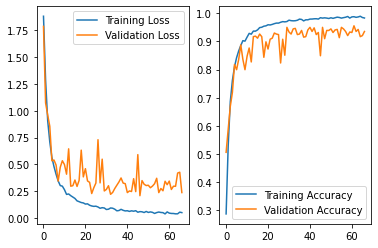

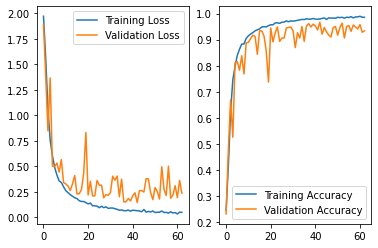

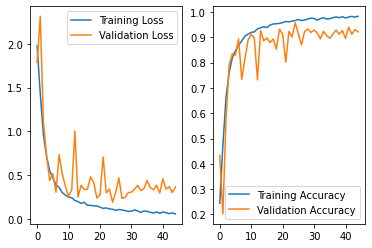

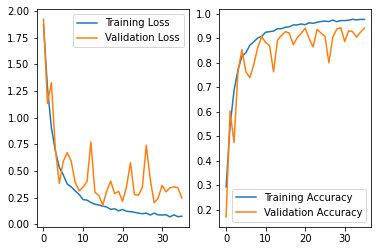

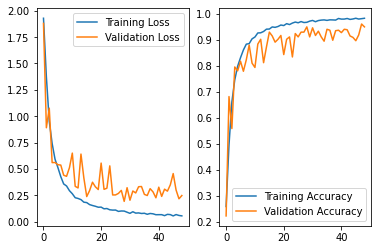

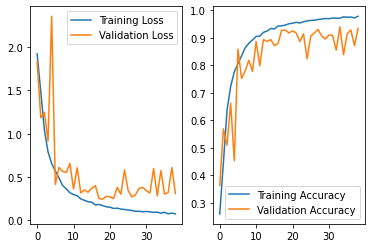

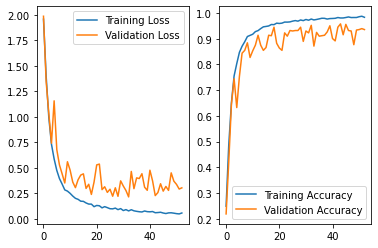

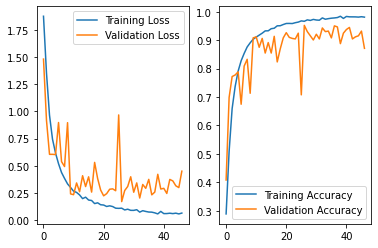

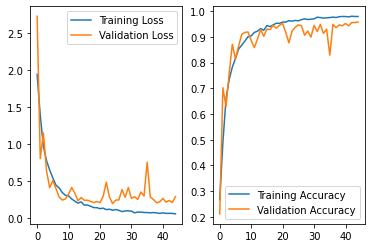

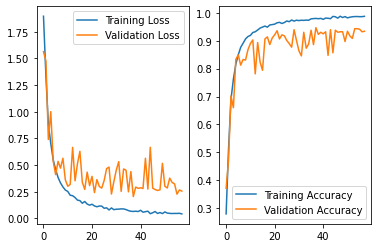

In [40]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [41]:
print_metrics(kFold_metrics)


precision mean by class [1.         0.90545122 0.8644697  0.89710298 0.98123235 0.93097034
 0.71995273 0.94462714]
precision sdev by class [0.         0.08605746 0.14672521 0.07484642 0.01360569 0.04772383
 0.10883295 0.04159899]
macro precision mean 0.9054758072596887
macro precision sdev 0.02493029075715007
recall mean [0.9        0.93653846 0.76893939 0.92287356 0.96394921 0.8997151
 0.91025641 0.9354878 ]
recall sdev [0.21343747 0.06906735 0.10525942 0.03739591 0.01789249 0.08445552
 0.07486565 0.04313679]
macro recall mean 0.9047199929449393
macro recall sdev 0.03171222107139596
f1 mean [0.93       0.9189693  0.80290972 0.90765255 0.9723797  0.91182957
 0.79581186 0.93877849]
f1 sdev [0.15524175 0.06765569 0.08353303 0.0397537  0.01122508 0.04777209
 0.05411422 0.0257988 ]
macro f1 mean 0.8972913999200269
macro f1 sdev 0.02838624316601013
accuracy mean 0.9390167433059778
accuracy sdev 0.015562937080065316


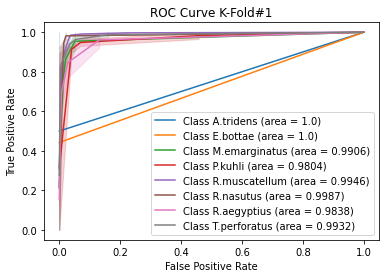

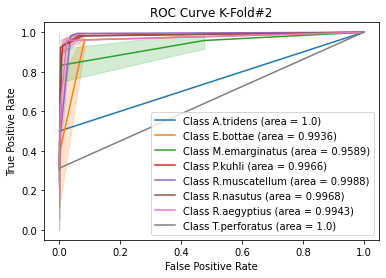

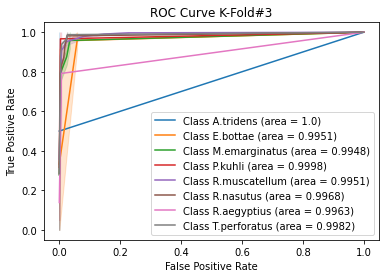

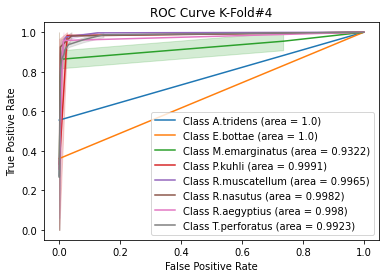

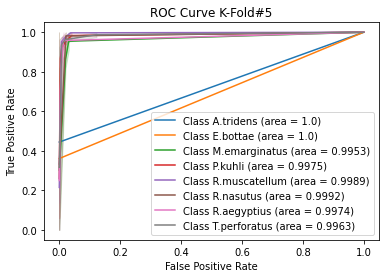

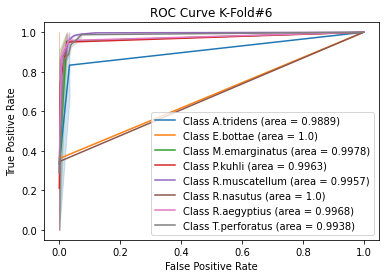

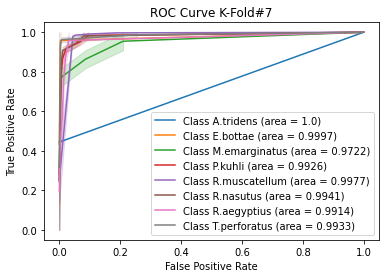

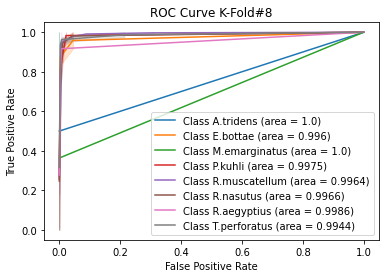

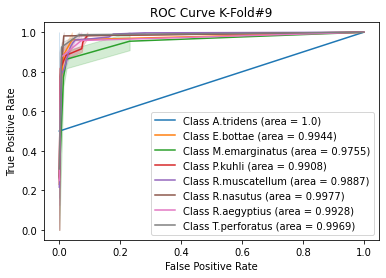

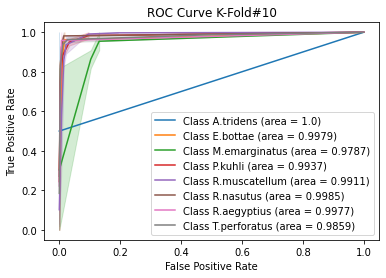

In [42]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [43]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.9988851727982162
Std  0.003344481605351157
Sp:  E.bottae
AUC Mean  0.9976670795613195
Std  0.0025007885109313266
Sp:  M.emarginatus
AUC Mean  0.9796127557121158
Std  0.020234786740659053
Sp:  P.kuhli
AUC Mean  0.9944458035717542
Std  0.005398450146340463
Sp:  R.muscatellum
AUC Mean  0.9953676325198254
Std  0.003097326119335582
Sp:  R.nasutus
AUC Mean  0.997657908865938
Std  0.001591971804678239
Sp:  R.aegyptius
AUC Mean  0.9946949219694119
Std  0.004284384459192908
Sp:  T.perforatus
AUC Mean  0.9944295246716616
Std  0.0036797413634905842


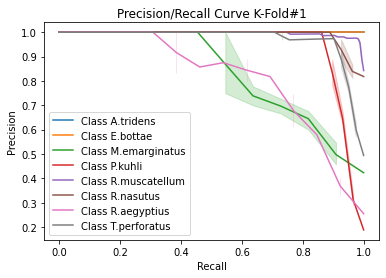

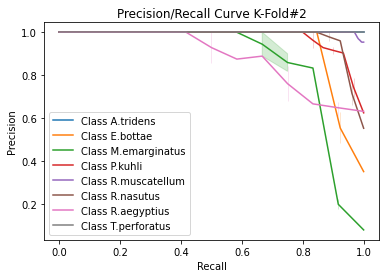

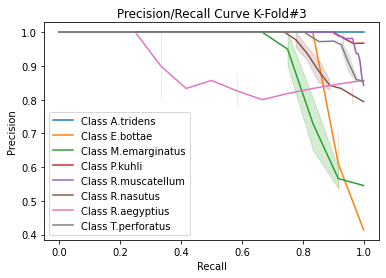

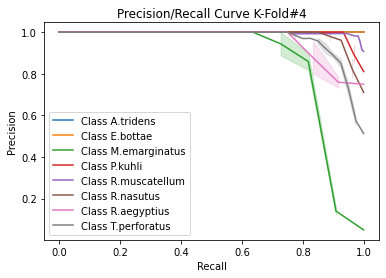

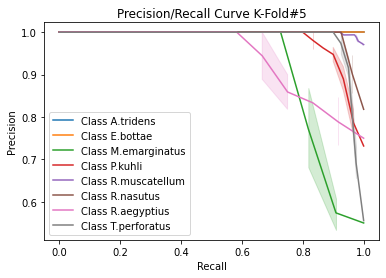

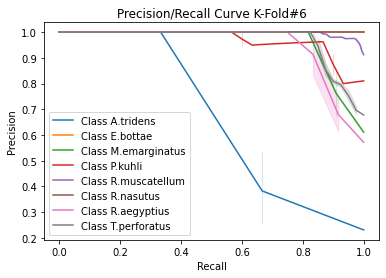

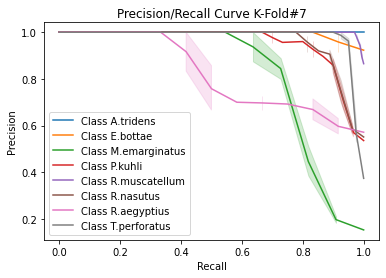

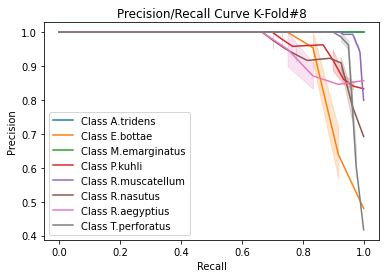

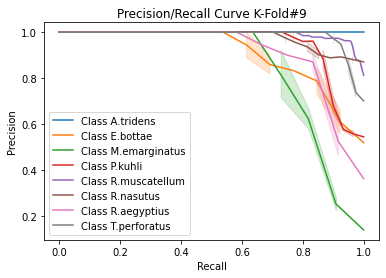

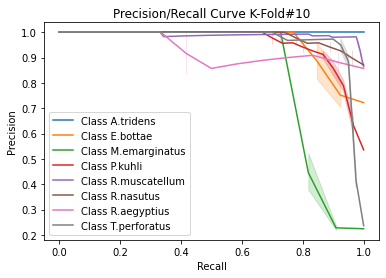

In [44]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   7   0   1   1   2   0]
 [  0   0   1  25   2   1   0   0]
 [  0   0   1   0 164   0   1   0]
 [  0   0   0   0   1  25   1   0]
 [  0   0   1   0   1   0  10   1]
 [  0   0   1   0   3   0   1  36]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   0   0   1   0]
 [  0   0   8   2   0   0   2   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   0   0 162   0   4   0]
 [  0   0   0   1   0  24   1   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   1   0   0]
 [  0   0   9   0   1   0   2   0]
 [  0   0   0  27   2   1   0   0]
 [  0   0   0   0 161   2   2   1]
 [  0   0   0   0   1  26   0   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   1   0   0   1   1  38]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

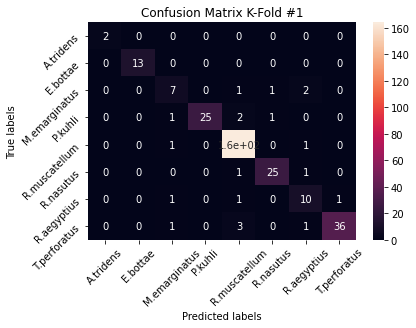

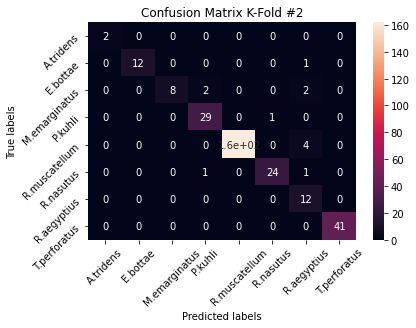

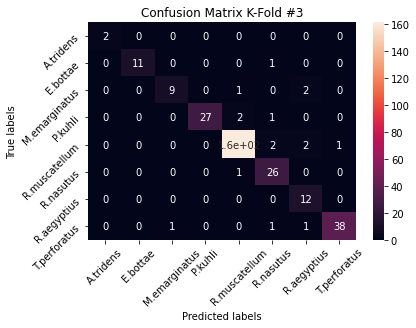

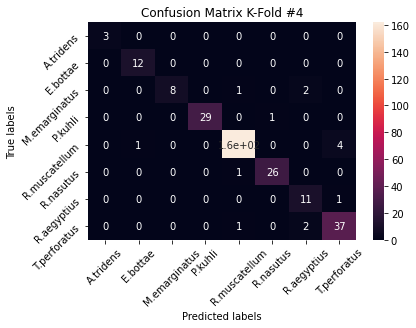

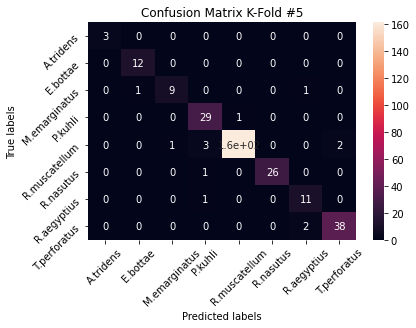

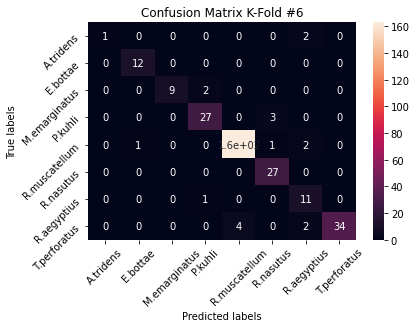

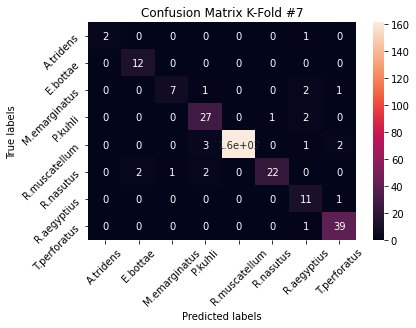

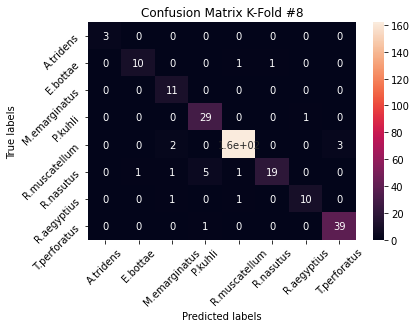

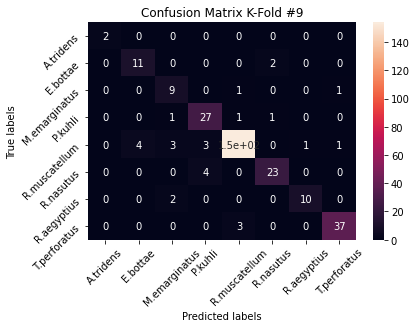

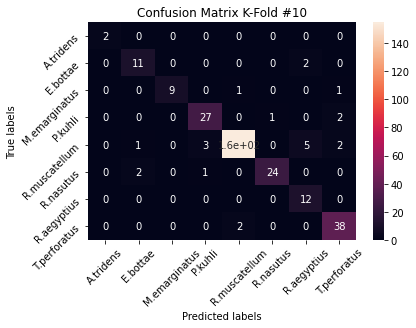

In [45]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  22    0    0    0    0    0    3    0]
 [   0  116    0    0    1    4    3    0]
 [   0    1   86    5    5    1   11    3]
 [   0    0    2  276    6   10    3    2]
 [   0    7    7   12 1605    3   16   15]
 [   0    5    2   14    4  242    2    0]
 [   0    0    4    2    2    0  110    3]
 [   0    0    2    1   13    1    9  377]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   1   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   1 160   0   1   1]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  11   0]
 [  0   0   0   0   1   0   0  37]]


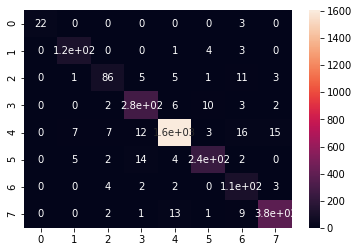

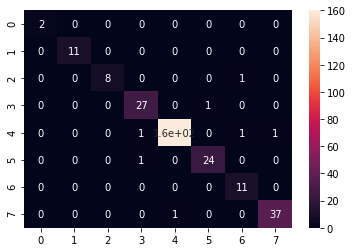

In [46]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.88 0.   0.   0.   0.   0.   0.12 0.  ]
 [0.   0.94 0.   0.   0.01 0.03 0.02 0.  ]
 [0.   0.01 0.77 0.04 0.04 0.01 0.1  0.03]
 [0.   0.   0.01 0.92 0.02 0.03 0.01 0.01]
 [0.   0.   0.   0.01 0.96 0.   0.01 0.01]
 [0.   0.02 0.01 0.05 0.01 0.9  0.01 0.  ]
 [0.   0.   0.03 0.02 0.02 0.   0.91 0.02]
 [0.   0.   0.   0.   0.03 0.   0.02 0.94]]


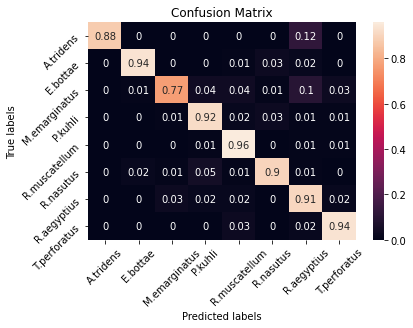

In [47]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)

<h2> V3 !!!!! K-Fold Training and Evaluation</h2>

In [17]:
folder = "models"
mode_version = "spec_RO_v3"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v3


In [18]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=176,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=144,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=192,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(144)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(80)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(96)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [19]:
model = build_current_model()
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 176)       26048     
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 176)       704       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 176)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 176)       0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 176)       0         
_________

In [20]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 14s - loss: 1.8395 - acc: 0.3044 - val_loss: 1.4498 - val_acc: 0.5441
Epoch 2/100
9592/9592 - 13s - loss: 1.4296 - acc: 0.4806 - val_loss: 1.2414 - val_acc: 0.5018
Epoch 3/100
9592/9592 - 13s - loss: 1.0197 - acc: 0.6318 - val_loss: 1.1262 - val_acc: 0.5533
Epoch 4/100
9592/9592 - 13s - loss: 0.7649 - acc: 0.7362 - val_loss: 0.7341 - val_acc: 0.7408
Epoch 5/100
9592/9592 - 13s - loss: 0.5926 - acc: 0.7991 - val_loss: 1.1254 - val_acc: 0.5

Epoch 26/100
9592/9592 - 13s - loss: 0.1274 - acc: 0.9628 - val_loss: 0.2328 - val_acc: 0.9228
Epoch 27/100
9592/9592 - 13s - loss: 0.1134 - acc: 0.9654 - val_loss: 0.4151 - val_acc: 0.8824
Epoch 28/100
9592/9592 - 14s - loss: 0.1098 - acc: 0.9642 - val_loss: 0.2682 - val_acc: 0.9210
Epoch 29/100
9592/9592 - 13s - loss: 0.1128 - acc: 0.9664 - val_loss: 0.3569 - val_acc: 0.9118
Epoch 30/100
9592/9592 - 14s - loss: 0.1120 - acc: 0.9632 - val_loss: 0.2717 - val_acc: 0.9173
Epoch 31/100
9592/9592 - 13s - loss: 0.1075 - acc: 0.9664 - val_loss: 0.3407 - val_acc: 0.9007
Epoch 32/100
9592/9592 - 14s - loss: 0.0980 - acc: 0.9686 - val_loss: 0.2625 - val_acc: 0.9136
Epoch 33/100
9592/9592 - 13s - loss: 0.0776 - acc: 0.9756 - val_loss: 0.2344 - val_acc: 0.9467
Epoch 34/100
9592/9592 - 13s - loss: 0.0917 - acc: 0.9710 - val_loss: 0.3650 - val_acc: 0.8952
Epoch 35/100
9592/9592 - 14s - loss: 0.0948 - acc: 0.9701 - val_loss: 0.2104 - val_acc: 0.9430
Epoch 36/100
9592/9592 - 13s - loss: 0.0842 - acc:

Epoch 19/100
9592/9592 - 13s - loss: 0.1388 - acc: 0.9556 - val_loss: 0.4897 - val_acc: 0.8511
Epoch 20/100
9592/9592 - 13s - loss: 0.1568 - acc: 0.9495 - val_loss: 0.3903 - val_acc: 0.8897
Epoch 21/100
9592/9592 - 13s - loss: 0.1474 - acc: 0.9527 - val_loss: 0.2439 - val_acc: 0.9228
Epoch 22/100
9592/9592 - 13s - loss: 0.1399 - acc: 0.9565 - val_loss: 0.3131 - val_acc: 0.9136
Epoch 23/100
9592/9592 - 13s - loss: 0.1345 - acc: 0.9567 - val_loss: 0.3572 - val_acc: 0.8989
Epoch 24/100
9592/9592 - 13s - loss: 0.1270 - acc: 0.9602 - val_loss: 0.2445 - val_acc: 0.9338
Epoch 25/100
9592/9592 - 13s - loss: 0.1230 - acc: 0.9609 - val_loss: 0.2848 - val_acc: 0.9099
Epoch 26/100
9592/9592 - 12s - loss: 0.1176 - acc: 0.9626 - val_loss: 0.2786 - val_acc: 0.9265
Epoch 27/100
9592/9592 - 12s - loss: 0.1129 - acc: 0.9619 - val_loss: 0.3584 - val_acc: 0.9062
Epoch 28/100
9592/9592 - 13s - loss: 0.1041 - acc: 0.9672 - val_loss: 0.4366 - val_acc: 0.8750
Epoch 29/100
9592/9592 - 13s - loss: 0.1106 - acc:

Epoch 46/100
9584/9584 - 13s - loss: 0.0642 - acc: 0.9813 - val_loss: 0.1886 - val_acc: 0.9485
Epoch 47/100
9584/9584 - 13s - loss: 0.0628 - acc: 0.9803 - val_loss: 0.2579 - val_acc: 0.9504
Epoch 48/100
9584/9584 - 13s - loss: 0.0504 - acc: 0.9848 - val_loss: 0.2387 - val_acc: 0.9412
Epoch 49/100
9584/9584 - 13s - loss: 0.0620 - acc: 0.9807 - val_loss: 0.2299 - val_acc: 0.9467
Epoch 50/100
9584/9584 - 13s - loss: 0.0578 - acc: 0.9813 - val_loss: 0.2840 - val_acc: 0.9375
Epoch 51/100
9584/9584 - 13s - loss: 0.0570 - acc: 0.9826 - val_loss: 0.2841 - val_acc: 0.9375
Epoch 52/100
9584/9584 - 13s - loss: 0.0534 - acc: 0.9849 - val_loss: 0.2639 - val_acc: 0.9375
Epoch 53/100
9584/9584 - 13s - loss: 0.0552 - acc: 0.9833 - val_loss: 0.2630 - val_acc: 0.9485
Epoch 54/100
Restoring model weights from the end of the best epoch.
9584/9584 - 13s - loss: 0.0496 - acc: 0.9843 - val_loss: 0.2973 - val_acc: 0.9393
Epoch 00054: early stopping
models/spec_RO_v3_iter_4.model
Original training set shape [(

Epoch 2/100
9584/9584 - 14s - loss: 1.5368 - acc: 0.4242 - val_loss: 1.8226 - val_acc: 0.1452
Epoch 3/100
9584/9584 - 14s - loss: 1.0677 - acc: 0.6236 - val_loss: 1.0376 - val_acc: 0.6158
Epoch 4/100
9584/9584 - 14s - loss: 0.7804 - acc: 0.7333 - val_loss: 0.7175 - val_acc: 0.7610
Epoch 5/100
9584/9584 - 14s - loss: 0.6331 - acc: 0.7876 - val_loss: 0.7331 - val_acc: 0.7684
Epoch 6/100
9584/9584 - 14s - loss: 0.5329 - acc: 0.8205 - val_loss: 1.2557 - val_acc: 0.5607
Epoch 7/100
9584/9584 - 14s - loss: 0.4661 - acc: 0.8475 - val_loss: 0.7091 - val_acc: 0.7794
Epoch 8/100
9584/9584 - 14s - loss: 0.4033 - acc: 0.8659 - val_loss: 0.4160 - val_acc: 0.8658
Epoch 9/100
9584/9584 - 14s - loss: 0.3533 - acc: 0.8828 - val_loss: 0.4087 - val_acc: 0.8640
Epoch 10/100
9584/9584 - 14s - loss: 0.3013 - acc: 0.9027 - val_loss: 0.4721 - val_acc: 0.8456
Epoch 11/100
9584/9584 - 14s - loss: 0.2618 - acc: 0.9146 - val_loss: 0.2842 - val_acc: 0.9154
Epoch 12/100
9584/9584 - 14s - loss: 0.2586 - acc: 0.9175 

Epoch 36/100
9584/9584 - 15s - loss: 0.0777 - acc: 0.9777 - val_loss: 0.3473 - val_acc: 0.8989
Epoch 37/100
9584/9584 - 15s - loss: 0.0783 - acc: 0.9756 - val_loss: 0.5142 - val_acc: 0.8713
Epoch 38/100
9584/9584 - 15s - loss: 0.0677 - acc: 0.9781 - val_loss: 0.6595 - val_acc: 0.8695
Epoch 39/100
9584/9584 - 15s - loss: 0.0671 - acc: 0.9791 - val_loss: 0.2636 - val_acc: 0.9540
Epoch 40/100
9584/9584 - 15s - loss: 0.0717 - acc: 0.9789 - val_loss: 0.4328 - val_acc: 0.8842
Epoch 41/100
9584/9584 - 15s - loss: 0.0578 - acc: 0.9819 - val_loss: 0.3975 - val_acc: 0.9191
Epoch 42/100
9584/9584 - 14s - loss: 0.0674 - acc: 0.9780 - val_loss: 0.2955 - val_acc: 0.9210
Epoch 43/100
9584/9584 - 15s - loss: 0.0602 - acc: 0.9811 - val_loss: 0.3004 - val_acc: 0.9228
Epoch 44/100
9584/9584 - 14s - loss: 0.0653 - acc: 0.9807 - val_loss: 0.2885 - val_acc: 0.9375
Epoch 45/100
9584/9584 - 15s - loss: 0.0517 - acc: 0.9835 - val_loss: 0.2872 - val_acc: 0.9320
Epoch 46/100
9584/9584 - 15s - loss: 0.0604 - acc:

Epoch 17/100
9584/9584 - 15s - loss: 0.1846 - acc: 0.9422 - val_loss: 0.2637 - val_acc: 0.9099
Epoch 18/100
9584/9584 - 15s - loss: 0.1622 - acc: 0.9485 - val_loss: 0.2802 - val_acc: 0.9136
Epoch 19/100
9584/9584 - 15s - loss: 0.1679 - acc: 0.9468 - val_loss: 0.4149 - val_acc: 0.8824
Epoch 20/100
9584/9584 - 16s - loss: 0.1410 - acc: 0.9550 - val_loss: 0.2650 - val_acc: 0.9136
Epoch 21/100
9584/9584 - 15s - loss: 0.1392 - acc: 0.9576 - val_loss: 0.4464 - val_acc: 0.8676
Epoch 22/100
9584/9584 - 15s - loss: 0.1389 - acc: 0.9582 - val_loss: 0.3670 - val_acc: 0.9007
Epoch 23/100
9584/9584 - 15s - loss: 0.1303 - acc: 0.9581 - val_loss: 0.3661 - val_acc: 0.9081
Epoch 24/100
9584/9584 - 15s - loss: 0.1203 - acc: 0.9615 - val_loss: 0.2608 - val_acc: 0.9393
Epoch 25/100
9584/9584 - 15s - loss: 0.1184 - acc: 0.9607 - val_loss: 0.2303 - val_acc: 0.9357
Epoch 26/100
9584/9584 - 16s - loss: 0.1151 - acc: 0.9642 - val_loss: 0.3205 - val_acc: 0.9136
Epoch 27/100
9584/9584 - 15s - loss: 0.1183 - acc:

Epoch 52/100
9592/9592 - 14s - loss: 0.0625 - acc: 0.9810 - val_loss: 0.1980 - val_acc: 0.9577
Epoch 53/100
9592/9592 - 14s - loss: 0.0560 - acc: 0.9829 - val_loss: 0.2260 - val_acc: 0.9540
Epoch 54/100
9592/9592 - 14s - loss: 0.0507 - acc: 0.9868 - val_loss: 0.2295 - val_acc: 0.9467
Epoch 55/100
9592/9592 - 14s - loss: 0.0494 - acc: 0.9852 - val_loss: 0.2195 - val_acc: 0.9596
Epoch 56/100
9592/9592 - 14s - loss: 0.0537 - acc: 0.9849 - val_loss: 0.2512 - val_acc: 0.9449
Epoch 57/100
Restoring model weights from the end of the best epoch.
9592/9592 - 15s - loss: 0.0453 - acc: 0.9872 - val_loss: 0.2407 - val_acc: 0.9449
Epoch 00057: early stopping
models/spec_RO_v3_iter_9.model
Original training set shape [('T.perforatus', 290), ('R.muscatellum', 1199), ('P.kuhli', 215), ('M.emarginatus', 81), ('R.aegyptius', 87), ('R.nasutus', 194), ('E.bottae', 89), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1199), ('R.muscatellum', 1199), ('P.kuhli', 1199), ('M.emarginatus', 119

In [21]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v3_iter_1.model
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
File Name Loaded:  models/spec_RO_v3_iter_2.model
File Name Loaded:  models/spec_RO_v3_iter_3.model
File Name Loaded:  models/spec_RO_v3_iter_4.model
File Name Loaded:  models/spec_RO_v3_iter_5.model
File Name Loaded:  models/spec_RO_v3_iter_6.model
File Name Loaded:  models/spec_RO_v3_iter_7.model
File Name Loaded:  models/spec_RO_v3_iter_8.model
File Name Loaded:  models/spec_RO_v3_iter_9.model
File Name Loaded:  models/spec_RO_v3_iter_10.model


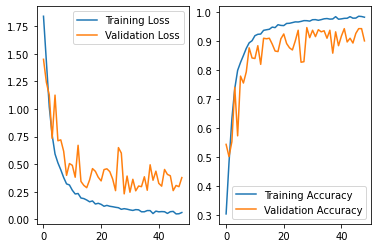

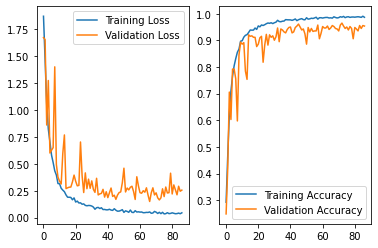

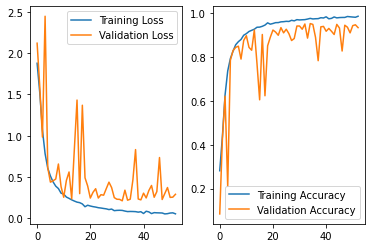

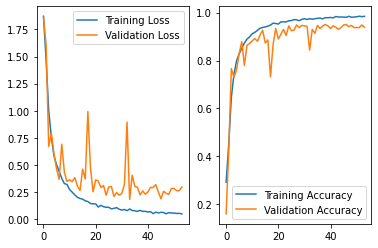

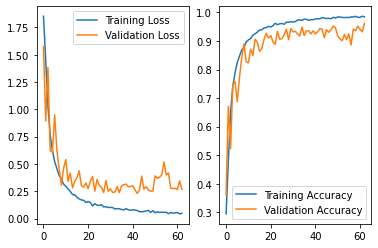

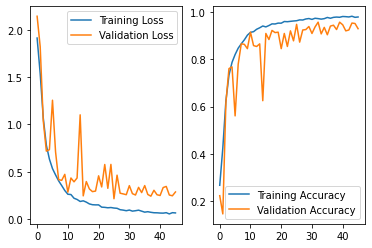

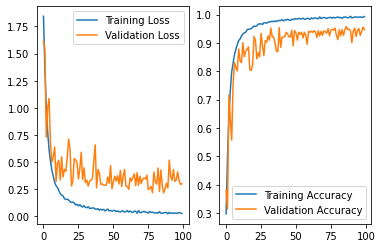

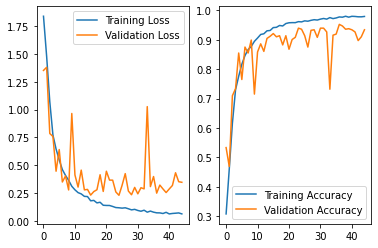

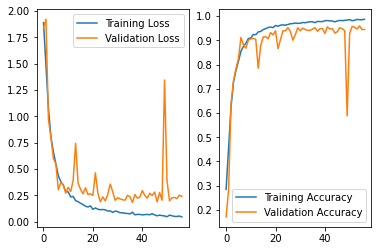

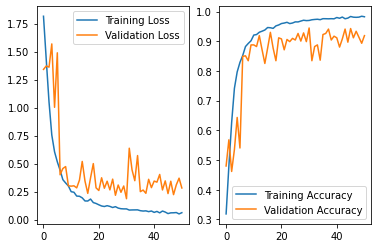

In [22]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [23]:
print_metrics(kFold_metrics)


precision mean by class [0.96666667 0.87553114 0.88897504 0.92160042 0.98303335 0.94788706
 0.72438662 0.9204593 ]
precision sdev by class [0.1        0.08923708 0.11546605 0.05975293 0.00862257 0.0356979
 0.10275215 0.05466886]
macro precision mean 0.9035674484128291
macro precision sdev 0.018524117649279997
recall mean [0.86666667 0.9275641  0.79393939 0.91954023 0.96937811 0.91837607
 0.86153846 0.93554878]
recall sdev [0.26666667 0.05625342 0.07056443 0.04814158 0.0170849  0.04612416
 0.1227426  0.04579918]
macro recall mean 0.8990689768381175
macro recall sdev 0.03431056701617433
f1 mean [0.88       0.8997908  0.83094213 0.91861385 0.97605295 0.9320088
 0.77814401 0.92655877]
f1 sdev [0.19899749 0.06961112 0.05815317 0.03440035 0.0092297  0.02977673
 0.08194737 0.03639101]
macro f1 mean 0.8927639141645065
macro f1 sdev 0.031000784055932554
accuracy mean 0.9416800510439813
accuracy sdev 0.012791878175601687


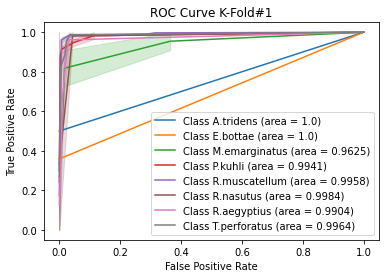

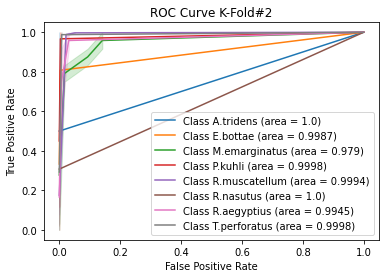

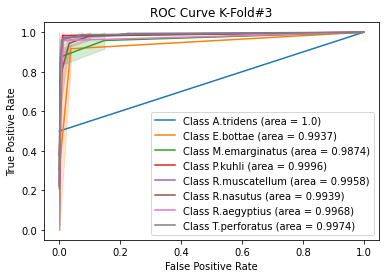

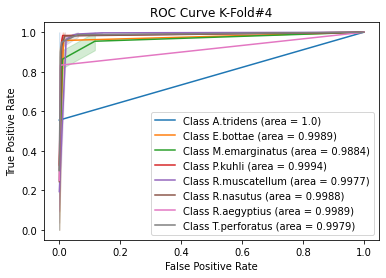

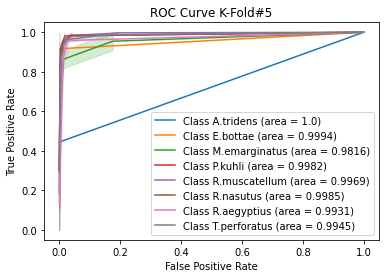

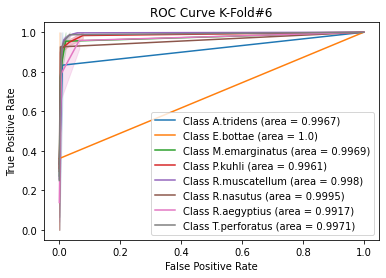

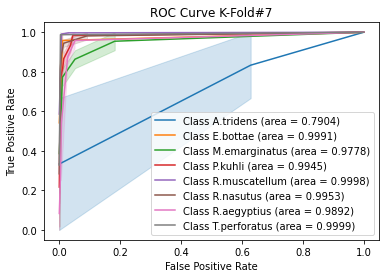

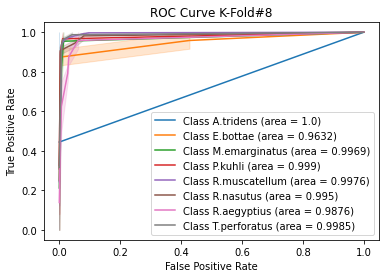

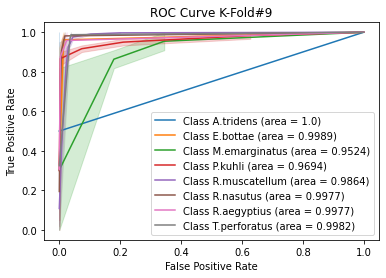

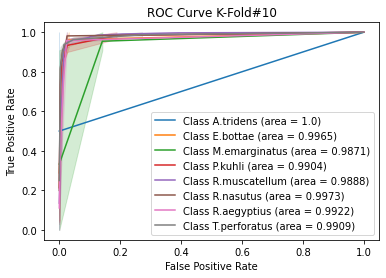

In [24]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [25]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.978706800445931
Std  0.06277269158026505
Sp:  E.bottae
AUC Mean  0.9948438897455274
Std  0.010697482155523096
Sp:  M.emarginatus
AUC Mean  0.9809970214049489
Std  0.013470633569976836
Sp:  P.kuhli
AUC Mean  0.9940361613485627
Std  0.00871980292984295
Sp:  R.muscatellum
AUC Mean  0.9956484365704374
Std  0.004223185967121251
Sp:  R.nasutus
AUC Mean  0.9974392587677258
Std  0.0019329790860732454
Sp:  R.aegyptius
AUC Mean  0.9932193430500614
Std  0.003534191586523567
Sp:  T.perforatus
AUC Mean  0.9970514143644988
Std  0.002547700290541159


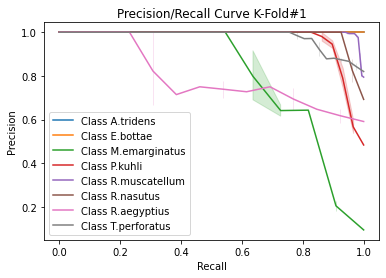

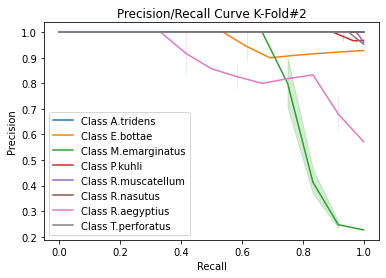

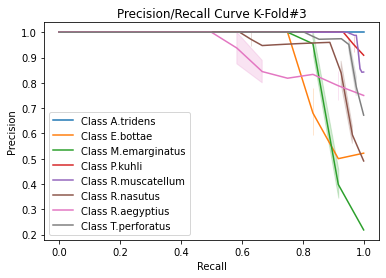

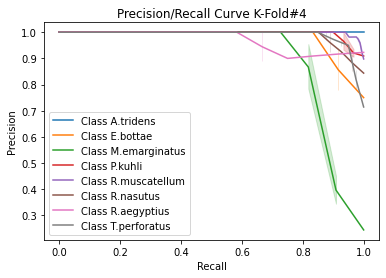

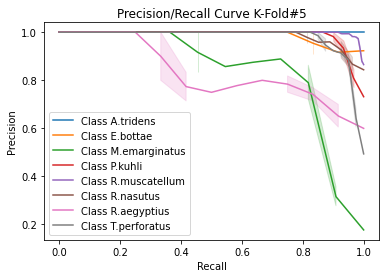

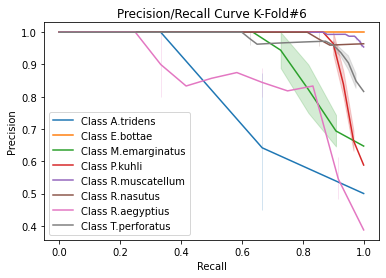

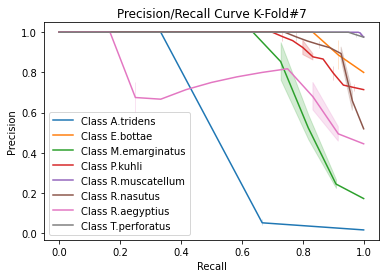

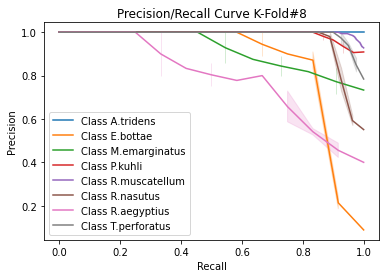

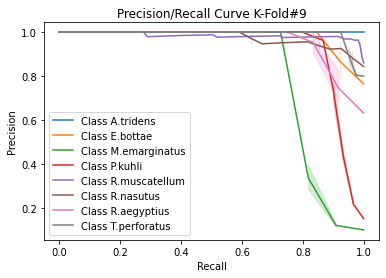

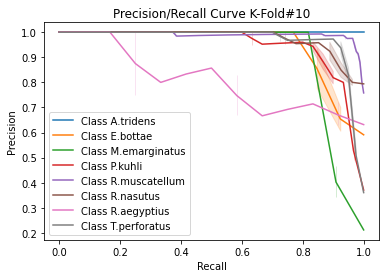

In [26]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0  10   0   0   0   1   0]
 [  0   0   1  25   2   0   0   1]
 [  0   0   1   0 163   0   1   1]
 [  0   0   0   0   0  26   1   0]
 [  0   1   1   0   0   0   8   3]
 [  0   0   4   0   2   0   0  35]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   9   1   0   0   1   1]
 [  0   0   0  30   0   0   0   0]
 [  0   0   0   1 163   0   1   1]
 [  0   0   1   0   0  25   0   0]
 [  0   1   0   0   1   0  10   0]
 [  0   0   0   0   1   0   0  40]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  11   0   0   0   1   0]
 [  0   0   0  28   2   0   0   0]
 [  0   1   0   0 162   0   2   1]
 [  0   2   0   0   0  24   1   0]
 [  0   0   0   0   0   0  12   0]
 [  0   0   1   0   0   0   1  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

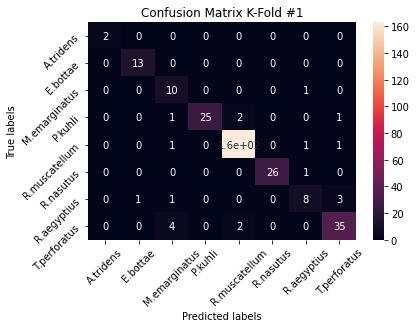

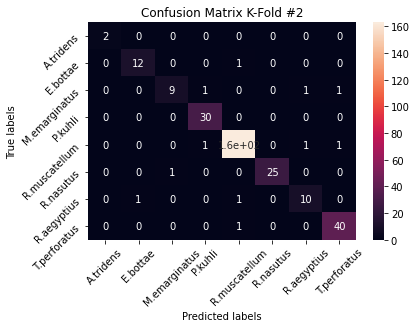

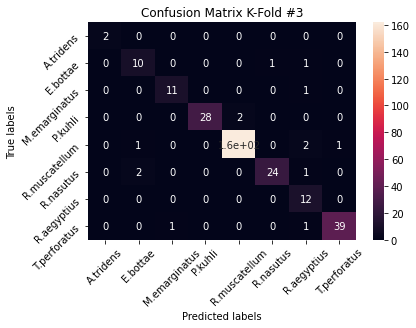

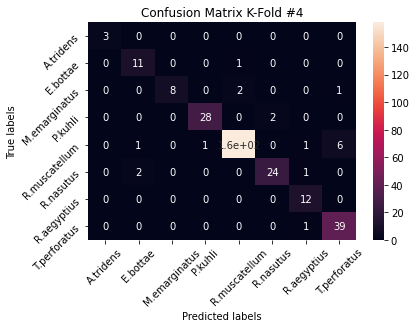

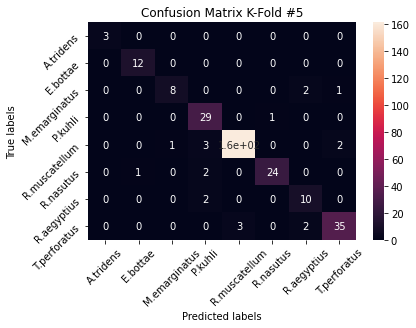

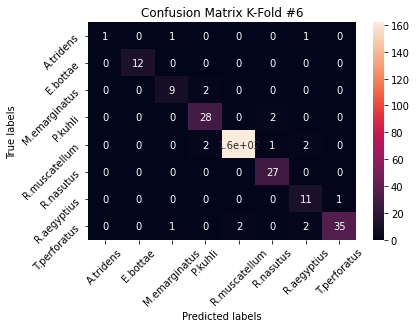

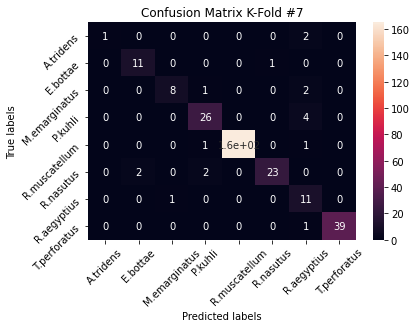

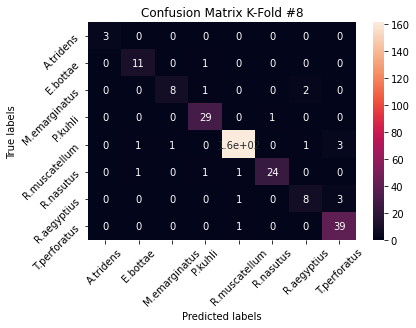

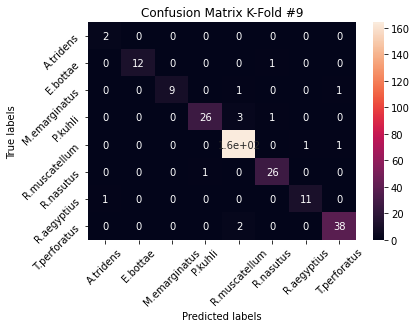

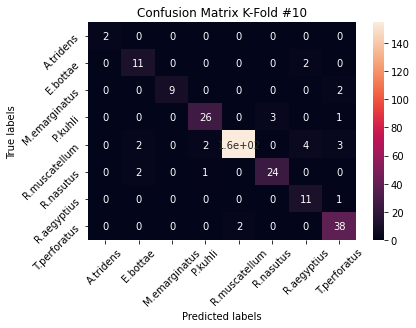

In [27]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  21    0    1    0    0    0    3    0]
 [   0  115    0    1    2    3    3    0]
 [   0    0   89    5    3    0    9    6]
 [   0    0    1  275    7   10    4    2]
 [   0    5    3   10 1614    1   14   18]
 [   0   10    1    7    1  247    3    0]
 [   1    2    2    2    2    0  104    8]
 [   0    0    6    0   13    0    7  377]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   0   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   1 161   0   1   1]
 [  0   1   0   0   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   0  37]]


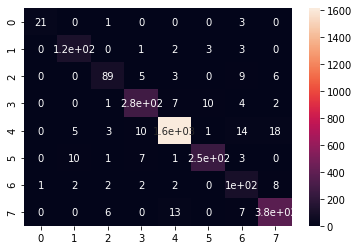

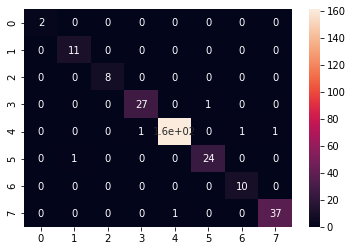

In [28]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.84 0.   0.04 0.   0.   0.   0.12 0.  ]
 [0.   0.93 0.   0.01 0.02 0.02 0.02 0.  ]
 [0.   0.   0.79 0.04 0.03 0.   0.08 0.05]
 [0.   0.   0.   0.92 0.02 0.03 0.01 0.01]
 [0.   0.   0.   0.01 0.97 0.   0.01 0.01]
 [0.   0.04 0.   0.03 0.   0.92 0.01 0.  ]
 [0.01 0.02 0.02 0.02 0.02 0.   0.86 0.07]
 [0.   0.   0.01 0.   0.03 0.   0.02 0.94]]


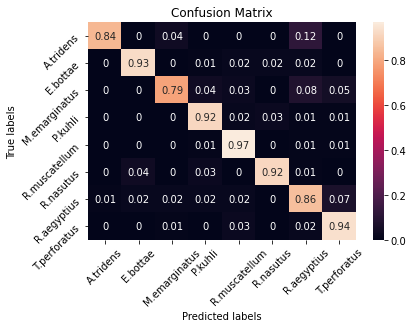

In [29]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)

<h2> V4 !!!!! K-Fold Training and Evaluation</h2>

In [17]:
folder = "models"
mode_version = "spec_RO_v4"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v4


In [18]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=160,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=112,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=80,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=64,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(256)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(448)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(352)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [19]:
model = build_current_model()
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 160)       23680     
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 160)       640       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 160)       0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 160)       0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 160)       0         
_________

In [20]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 14s - loss: 1.8893 - acc: 0.3048 - val_loss: 1.4558 - val_acc: 0.5496
Epoch 2/100
9592/9592 - 13s - loss: 1.4380 - acc: 0.4680 - val_loss: 1.2408 - val_acc: 0.5441
Epoch 3/100
9592/9592 - 13s - loss: 0.9809 - acc: 0.6528 - val_loss: 1.1393 - val_acc: 0.5349
Epoch 4/100
9592/9592 - 13s - loss: 0.7436 - acc: 0.7389 - val_loss: 0.7005 - val_acc: 0.7574
Epoch 5/100
9592/9592 - 13s - loss: 0.5601 - acc: 0.8049 - val_loss: 1.3208 - val_acc: 0.4

Epoch 23/100
9592/9592 - 13s - loss: 0.1175 - acc: 0.9628 - val_loss: 0.4129 - val_acc: 0.8585
Epoch 24/100
9592/9592 - 13s - loss: 0.1149 - acc: 0.9622 - val_loss: 0.1663 - val_acc: 0.9540
Epoch 25/100
9592/9592 - 13s - loss: 0.1128 - acc: 0.9628 - val_loss: 0.2402 - val_acc: 0.9301
Epoch 26/100
9592/9592 - 14s - loss: 0.1055 - acc: 0.9667 - val_loss: 0.1968 - val_acc: 0.9393
Epoch 27/100
9592/9592 - 14s - loss: 0.1096 - acc: 0.9647 - val_loss: 0.2151 - val_acc: 0.9228
Epoch 28/100
9592/9592 - 14s - loss: 0.0912 - acc: 0.9704 - val_loss: 0.2076 - val_acc: 0.9393
Epoch 29/100
9592/9592 - 13s - loss: 0.1013 - acc: 0.9674 - val_loss: 0.2485 - val_acc: 0.8915
Epoch 30/100
9592/9592 - 14s - loss: 0.0898 - acc: 0.9715 - val_loss: 0.4716 - val_acc: 0.8897
Epoch 31/100
9592/9592 - 13s - loss: 0.0963 - acc: 0.9709 - val_loss: 0.1660 - val_acc: 0.9338
Epoch 32/100
9592/9592 - 14s - loss: 0.0883 - acc: 0.9741 - val_loss: 0.6365 - val_acc: 0.7941
Epoch 33/100
9592/9592 - 13s - loss: 0.0783 - acc:

Epoch 35/100
9592/9592 - 14s - loss: 0.0701 - acc: 0.9761 - val_loss: 0.2918 - val_acc: 0.9301
Epoch 36/100
9592/9592 - 14s - loss: 0.0647 - acc: 0.9791 - val_loss: 0.2888 - val_acc: 0.9228
Epoch 37/100
9592/9592 - 14s - loss: 0.0767 - acc: 0.9763 - val_loss: 0.3235 - val_acc: 0.9099
Epoch 38/100
9592/9592 - 14s - loss: 0.0643 - acc: 0.9812 - val_loss: 0.2918 - val_acc: 0.9283
Epoch 39/100
9592/9592 - 14s - loss: 0.0673 - acc: 0.9773 - val_loss: 0.3061 - val_acc: 0.9265
Epoch 40/100
9592/9592 - 14s - loss: 0.0590 - acc: 0.9808 - val_loss: 0.3209 - val_acc: 0.9246
Epoch 41/100
9592/9592 - 14s - loss: 0.0624 - acc: 0.9809 - val_loss: 0.2682 - val_acc: 0.9357
Epoch 42/100
9592/9592 - 14s - loss: 0.0537 - acc: 0.9837 - val_loss: 0.3135 - val_acc: 0.9246
Epoch 43/100
9592/9592 - 14s - loss: 0.0686 - acc: 0.9785 - val_loss: 0.3484 - val_acc: 0.9338
Epoch 44/100
9592/9592 - 14s - loss: 0.0575 - acc: 0.9843 - val_loss: 0.3515 - val_acc: 0.9044
Epoch 45/100
9592/9592 - 14s - loss: 0.0618 - acc:

Epoch 11/100
9584/9584 - 13s - loss: 0.2401 - acc: 0.9197 - val_loss: 0.3211 - val_acc: 0.9062
Epoch 12/100
9584/9584 - 13s - loss: 0.2246 - acc: 0.9253 - val_loss: 0.4356 - val_acc: 0.8732
Epoch 13/100
9584/9584 - 13s - loss: 0.2150 - acc: 0.9262 - val_loss: 0.3423 - val_acc: 0.8879
Epoch 14/100
9584/9584 - 13s - loss: 0.1988 - acc: 0.9344 - val_loss: 0.4028 - val_acc: 0.8676
Epoch 15/100
9584/9584 - 13s - loss: 0.1716 - acc: 0.9421 - val_loss: 0.3174 - val_acc: 0.9007
Epoch 16/100
9584/9584 - 13s - loss: 0.1676 - acc: 0.9463 - val_loss: 0.4567 - val_acc: 0.8419
Epoch 17/100
9584/9584 - 13s - loss: 0.1567 - acc: 0.9484 - val_loss: 0.2697 - val_acc: 0.9283
Epoch 18/100
9584/9584 - 13s - loss: 0.1482 - acc: 0.9506 - val_loss: 0.2982 - val_acc: 0.9136
Epoch 19/100
9584/9584 - 13s - loss: 0.1494 - acc: 0.9544 - val_loss: 0.2552 - val_acc: 0.9136
Epoch 20/100
9584/9584 - 13s - loss: 0.1231 - acc: 0.9594 - val_loss: 0.2970 - val_acc: 0.9375
Epoch 21/100
9584/9584 - 13s - loss: 0.1332 - acc:

Epoch 25/100
9584/9584 - 15s - loss: 0.1176 - acc: 0.9624 - val_loss: 0.3166 - val_acc: 0.9265
Epoch 26/100
9584/9584 - 16s - loss: 0.1000 - acc: 0.9698 - val_loss: 0.4826 - val_acc: 0.8640
Epoch 27/100
9584/9584 - 15s - loss: 0.0926 - acc: 0.9719 - val_loss: 0.2739 - val_acc: 0.9338
Epoch 28/100
9584/9584 - 15s - loss: 0.0890 - acc: 0.9718 - val_loss: 0.3116 - val_acc: 0.9283
Epoch 29/100
9584/9584 - 15s - loss: 0.0876 - acc: 0.9721 - val_loss: 1.0614 - val_acc: 0.6691
Epoch 30/100
9584/9584 - 15s - loss: 0.0918 - acc: 0.9707 - val_loss: 0.2563 - val_acc: 0.9449
Epoch 31/100
9584/9584 - 15s - loss: 0.0856 - acc: 0.9738 - val_loss: 0.3093 - val_acc: 0.9154
Epoch 32/100
9584/9584 - 15s - loss: 0.0867 - acc: 0.9716 - val_loss: 0.3065 - val_acc: 0.9118
Epoch 33/100
9584/9584 - 15s - loss: 0.0702 - acc: 0.9774 - val_loss: 0.3512 - val_acc: 0.9099
Epoch 34/100
9584/9584 - 15s - loss: 0.0672 - acc: 0.9802 - val_loss: 0.2707 - val_acc: 0.9173
Epoch 35/100
9584/9584 - 15s - loss: 0.0913 - acc:

Epoch 30/100
9584/9584 - 15s - loss: 0.0958 - acc: 0.9685 - val_loss: 0.2268 - val_acc: 0.9467
Epoch 31/100
9584/9584 - 15s - loss: 0.0878 - acc: 0.9726 - val_loss: 0.5748 - val_acc: 0.8860
Epoch 32/100
9584/9584 - 15s - loss: 0.0813 - acc: 0.9753 - val_loss: 0.5527 - val_acc: 0.8419
Epoch 33/100
9584/9584 - 15s - loss: 0.0856 - acc: 0.9719 - val_loss: 0.3814 - val_acc: 0.8934
Epoch 34/100
9584/9584 - 15s - loss: 0.0665 - acc: 0.9805 - val_loss: 0.5505 - val_acc: 0.8585
Epoch 35/100
9584/9584 - 15s - loss: 0.0861 - acc: 0.9735 - val_loss: 0.3124 - val_acc: 0.9118
Epoch 36/100
9584/9584 - 15s - loss: 0.0674 - acc: 0.9792 - val_loss: 0.3076 - val_acc: 0.9357
Epoch 37/100
9584/9584 - 15s - loss: 0.0770 - acc: 0.9766 - val_loss: 0.2668 - val_acc: 0.9320
Epoch 38/100
9584/9584 - 15s - loss: 0.0687 - acc: 0.9804 - val_loss: 0.3234 - val_acc: 0.9118
Epoch 39/100
9584/9584 - 15s - loss: 0.0726 - acc: 0.9756 - val_loss: 0.3514 - val_acc: 0.9118
Epoch 40/100
9584/9584 - 16s - loss: 0.0636 - acc:

Epoch 17/100
9592/9592 - 14s - loss: 0.1629 - acc: 0.9487 - val_loss: 0.2507 - val_acc: 0.9136
Epoch 18/100
9592/9592 - 14s - loss: 0.1567 - acc: 0.9484 - val_loss: 0.2547 - val_acc: 0.9301
Epoch 19/100
9592/9592 - 14s - loss: 0.1340 - acc: 0.9568 - val_loss: 0.3888 - val_acc: 0.9062
Epoch 20/100
9592/9592 - 14s - loss: 0.1356 - acc: 0.9565 - val_loss: 0.2612 - val_acc: 0.9265
Epoch 21/100
9592/9592 - 14s - loss: 0.1314 - acc: 0.9574 - val_loss: 0.3360 - val_acc: 0.8989
Epoch 22/100
9592/9592 - 14s - loss: 0.1335 - acc: 0.9562 - val_loss: 0.1829 - val_acc: 0.9467
Epoch 23/100
9592/9592 - 14s - loss: 0.1122 - acc: 0.9634 - val_loss: 0.2163 - val_acc: 0.9320
Epoch 24/100
9592/9592 - 14s - loss: 0.1041 - acc: 0.9681 - val_loss: 0.2207 - val_acc: 0.9467
Epoch 25/100
9592/9592 - 14s - loss: 0.1110 - acc: 0.9630 - val_loss: 0.4701 - val_acc: 0.8879
Epoch 26/100
9592/9592 - 14s - loss: 0.1100 - acc: 0.9662 - val_loss: 0.1991 - val_acc: 0.9467
Epoch 27/100
9592/9592 - 15s - loss: 0.0973 - acc:

Epoch 55/100
9592/9592 - 16s - loss: 0.0436 - acc: 0.9862 - val_loss: 0.2303 - val_acc: 0.9357
Epoch 56/100
9592/9592 - 16s - loss: 0.0404 - acc: 0.9866 - val_loss: 0.2602 - val_acc: 0.9485
Epoch 57/100
9592/9592 - 15s - loss: 0.0589 - acc: 0.9820 - val_loss: 0.2648 - val_acc: 0.9301
Epoch 58/100
9592/9592 - 16s - loss: 0.0468 - acc: 0.9856 - val_loss: 0.2882 - val_acc: 0.9062
Epoch 59/100
9592/9592 - 16s - loss: 0.0472 - acc: 0.9849 - val_loss: 0.3135 - val_acc: 0.9136
Epoch 60/100
9592/9592 - 16s - loss: 0.0500 - acc: 0.9866 - val_loss: 0.2681 - val_acc: 0.9320
Epoch 61/100
9592/9592 - 16s - loss: 0.0456 - acc: 0.9870 - val_loss: 0.2650 - val_acc: 0.9283
Epoch 62/100
9592/9592 - 16s - loss: 0.0405 - acc: 0.9874 - val_loss: 0.1841 - val_acc: 0.9540
Epoch 63/100
9592/9592 - 16s - loss: 0.0480 - acc: 0.9854 - val_loss: 0.4159 - val_acc: 0.9062
Epoch 64/100
9592/9592 - 16s - loss: 0.0479 - acc: 0.9852 - val_loss: 0.2920 - val_acc: 0.9320
Epoch 65/100
9592/9592 - 16s - loss: 0.0385 - acc:

In [21]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v4_iter_1.model
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
File Name Loaded:  models/spec_RO_v4_iter_2.model
File Name Loaded:  models/spec_RO_v4_iter_3.model
File Name Loaded:  models/spec_RO_v4_iter_4.model
File Name Loaded:  models/spec_RO_v4_iter_5.model
File Name Loaded:  models/spec_RO_v4_iter_6.model
File Name Loaded:  models/spec_RO_v4_iter_7.model
File Name Loaded:  models/spec_RO_v4_iter_8.model
File Name Loaded:  models/spec_RO_v4_iter_9.model
File Name Loaded:  models/spec_RO_v4_iter_10.model


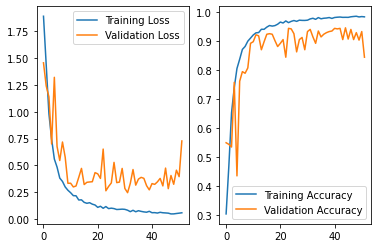

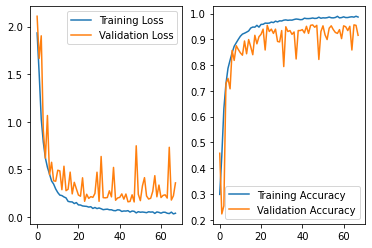

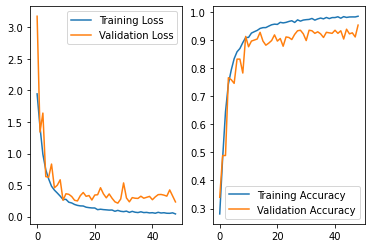

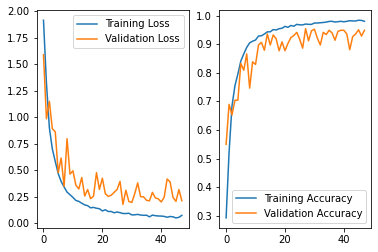

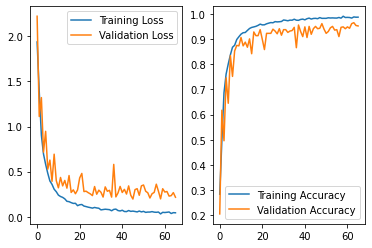

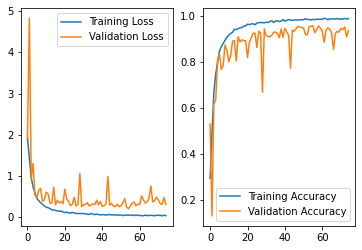

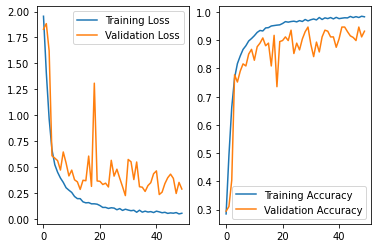

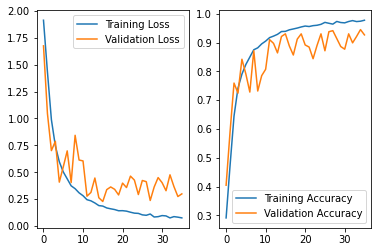

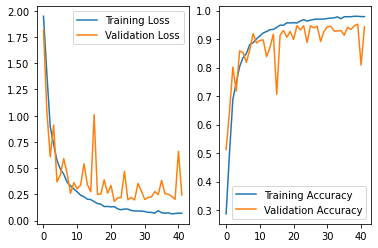

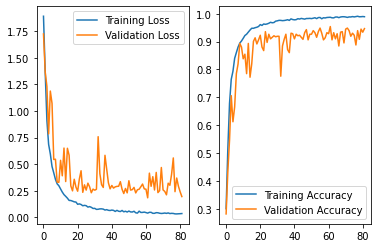

In [22]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [23]:
print_metrics(kFold_metrics)


precision mean by class [0.96666667 0.87408369 0.84082751 0.90552604 0.98479285 0.93237079
 0.6879603  0.92010951]
precision sdev by class [0.1        0.09663721 0.1466404  0.05967397 0.01343273 0.02496662
 0.06778061 0.04914351]
macro precision mean 0.8890421693981301
macro precision sdev 0.03169951792522484
recall mean [0.85       0.89487179 0.78484848 0.92977011 0.96277686 0.91111111
 0.83461538 0.93786585]
recall sdev [0.2409472  0.09877621 0.11639086 0.03784543 0.01534231 0.07066216
 0.1054794  0.04051686]
macro recall mean 0.8882324499968177
macro recall sdev 0.03216975479692946
f1 mean [0.87666667 0.87825139 0.79962848 0.91672074 0.97356288 0.9199098
 0.75198665 0.92765717]
f1 sdev [0.17       0.06881078 0.08928823 0.04329303 0.01077742 0.0370481
 0.0747349  0.03047642]
macro f1 mean 0.880547973036683
macro f1 sdev 0.02952052674346024
accuracy mean 0.9360366108556469
accuracy sdev 0.018858932534282953


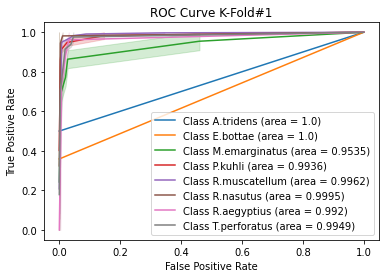

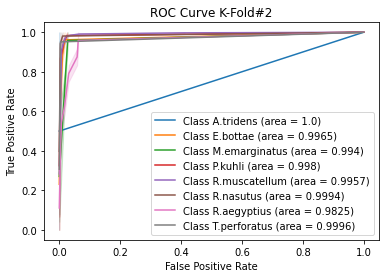

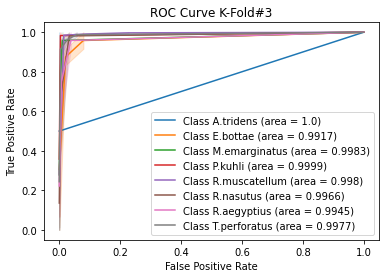

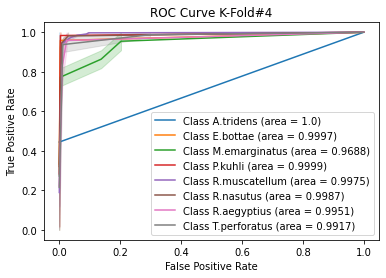

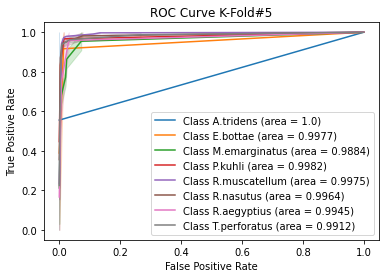

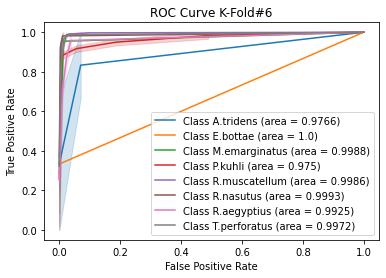

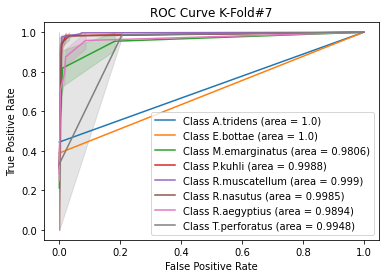

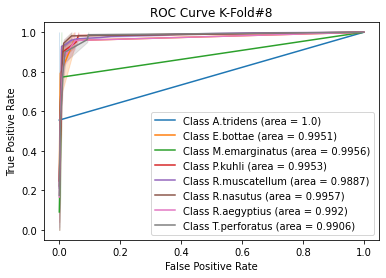

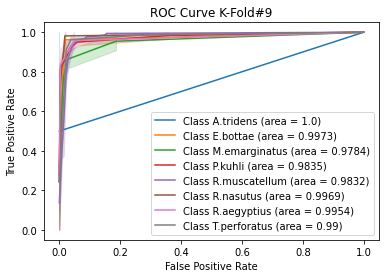

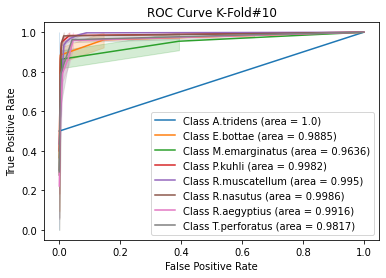

In [24]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [25]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.9976588628762542
Std  0.007023411371237453
Sp:  E.bottae
AUC Mean  0.9966579211780411
Std  0.0037147513346723338
Sp:  M.emarginatus
AUC Mean  0.9819908379924376
Std  0.015027914423859076
Sp:  P.kuhli
AUC Mean  0.9940304512111892
Std  0.007846336508254451
Sp:  R.muscatellum
AUC Mean  0.9949406606505077
Std  0.004813405681053799
Sp:  R.nasutus
AUC Mean  0.9979628386000966
Std  0.0013486812912813593
Sp:  R.aegyptius
AUC Mean  0.9919556368342313
Std  0.0036358577565273596
Sp:  T.perforatus
AUC Mean  0.9929542416311238
Std  0.004869916835914348


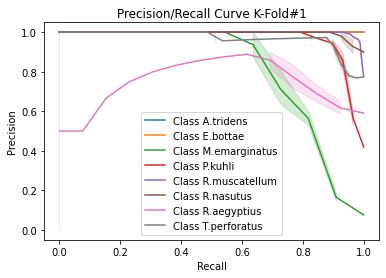

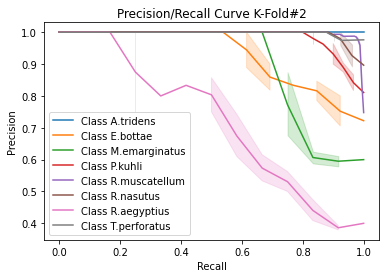

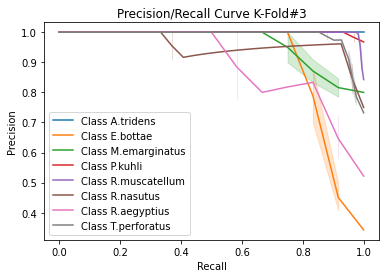

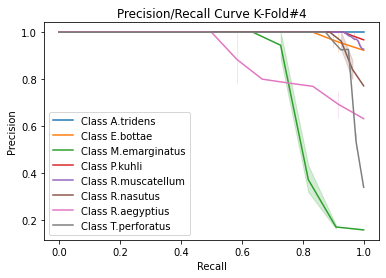

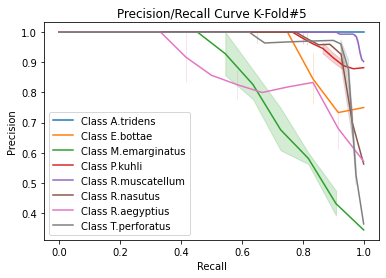

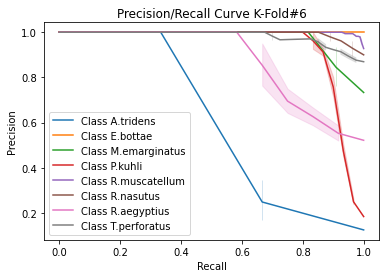

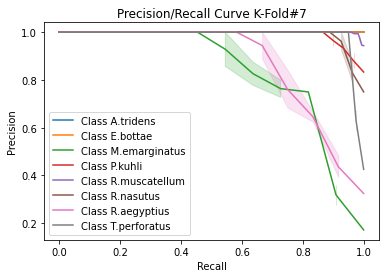

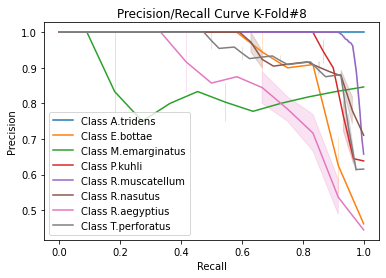

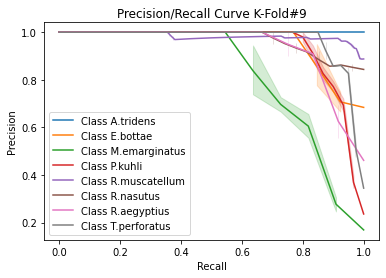

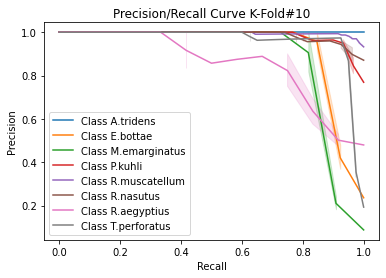

In [26]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  1   0   0   0   0   0   1   0]
 [  0  12   0   0   0   1   0   0]
 [  0   0   8   0   1   0   1   1]
 [  0   0   0  27   1   0   1   0]
 [  0   0   0   0 163   0   1   2]
 [  0   0   0   2   0  25   0   0]
 [  0   0   0   0   1   0  11   1]
 [  0   0   1   0   3   0   0  37]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   2   0   0]
 [  0   0   9   1   0   0   2   0]
 [  0   0   0  27   1   1   1   0]
 [  0   1   0   0 162   0   2   1]
 [  0   0   0   0   0  26   0   0]
 [  1   2   0   1   1   0   7   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0  11   0   0   0   1   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   0   1 162   0   2   1]
 [  0   0   0   0   0  26   1   0]
 [  0   0   1   0   0   0  11   0]
 [  0   0   1   0   0   0   1  39]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

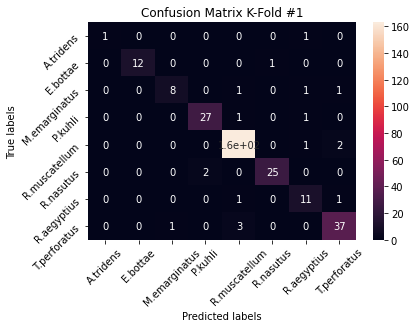

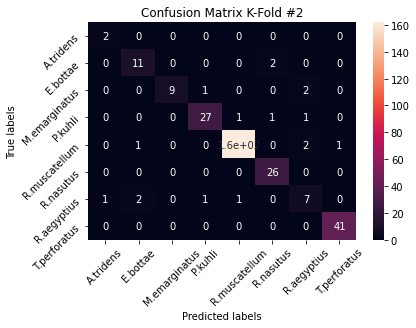

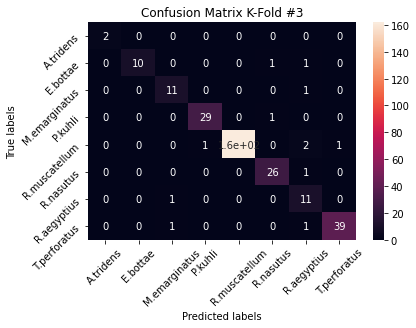

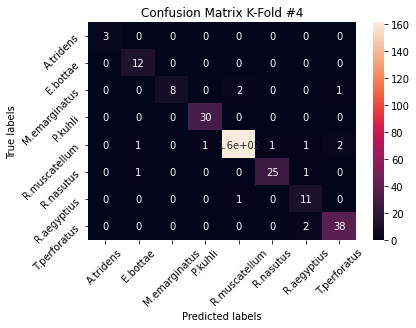

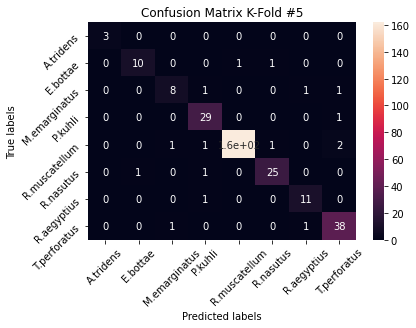

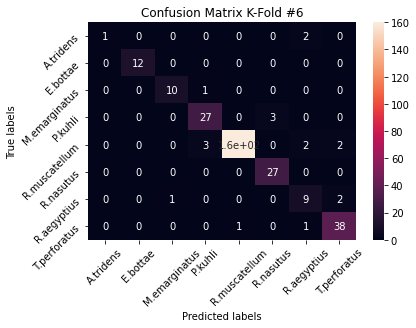

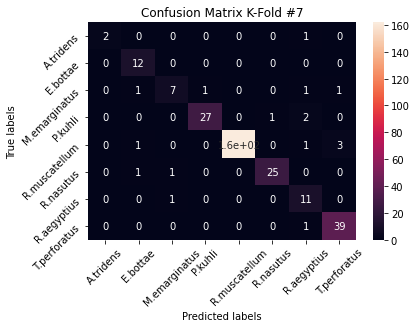

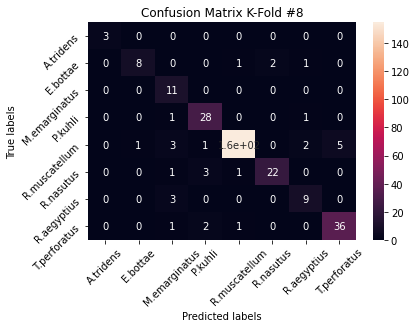

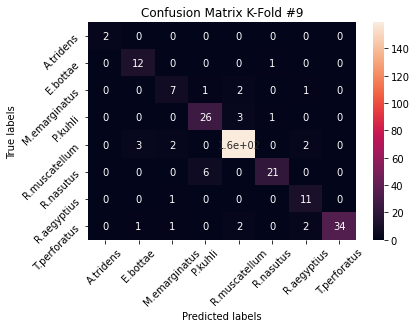

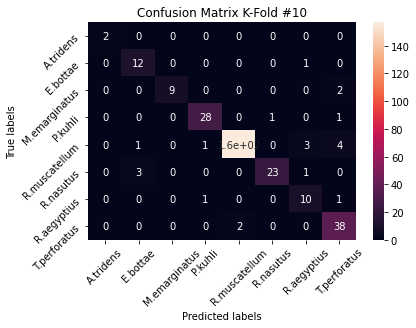

In [27]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  21    0    0    0    0    0    4    0]
 [   0  111    0    0    2    8    3    0]
 [   0    1   88    5    5    0    7    6]
 [   0    0    1  278    5    8    5    2]
 [   0    8    6    8 1603    2   16   22]
 [   0    6    2   12    1  245    3    0]
 [   1    2    7    3    3    0  101    4]
 [   0    1    5    2    9    0    8  378]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   0   0]
 [  0   0   0  27   0   0   0   0]
 [  0   0   0   0 160   0   1   2]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   0   0   0  37]]


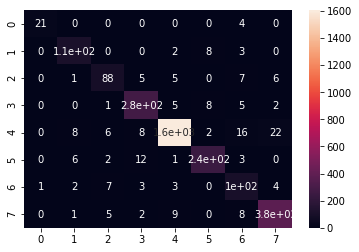

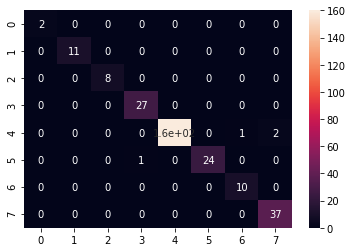

In [28]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.84 0.   0.   0.   0.   0.   0.16 0.  ]
 [0.   0.9  0.   0.   0.02 0.06 0.02 0.  ]
 [0.   0.01 0.79 0.04 0.04 0.   0.06 0.05]
 [0.   0.   0.   0.93 0.02 0.03 0.02 0.01]
 [0.   0.   0.   0.   0.96 0.   0.01 0.01]
 [0.   0.02 0.01 0.04 0.   0.91 0.01 0.  ]
 [0.01 0.02 0.06 0.02 0.02 0.   0.83 0.03]
 [0.   0.   0.01 0.   0.02 0.   0.02 0.94]]


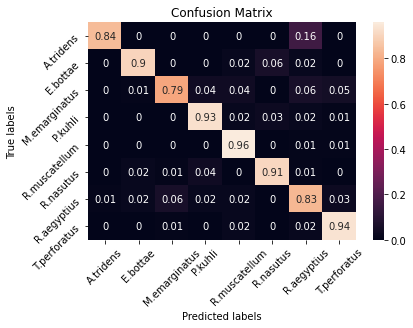

In [29]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)

<h2> V5 !!!!! K-Fold Training and Evaluation</h2>

In [17]:
folder = "models"
mode_version = "spec_RO_v5"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v5


In [18]:
def build_current_model():
    inp = Input(shape=(112,170,3))
    lay = Convolution2D(filters=48,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=32,kernel_size=(5,5),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.06)(lay)

    lay = Convolution2D(filters=48,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Convolution2D(filters=128,kernel_size=(3,3),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = SpatialDropout2D(0.02)(lay)

    lay = Flatten()(lay)

    lay = Dense(112)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)
    
    lay = Dense(32)(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = Dropout(0.15)(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model


In [19]:
model = build_current_model()
model.summary()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Model: "model"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 112, 170, 3)]     0         
_________________________________________________________________
conv2d (Conv2D)              (None, 56, 85, 48)        7104      
_________________________________________________________________
batch_normalization (BatchNo (None, 56, 85, 48)        192       
_________________________________________________________________
activation (Activation)      (None, 56, 85, 48)        0         
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 28, 43, 48)        0         
_________________________________________________________________
spatial_dropout2d (SpatialDr (None, 28, 43, 48)        0         
_________

In [20]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 112, 170, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 8s - loss: 1.7586 - acc: 0.3332 - val_loss: 1.3635 - val_acc: 0.5515
Epoch 2/100
9592/9592 - 7s - loss: 1.2069 - acc: 0.5649 - val_loss: 1.0581 - val_acc: 0.6618
Epoch 3/100
9592/9592 - 7s - loss: 0.8320 - acc: 0.7168 - val_loss: 1.3281 - val_acc: 0.6085
Epoch 4/100
9592/9592 - 7s - loss: 0.6300 - acc: 0.7861 - val_loss: 0.6757 - val_acc: 0.7647
Epoch 5/100
9592/9592 - 8s - loss: 0.5154 - acc: 0.8279 - val_loss: 0.5736 - val_acc: 0.7978
E

Epoch 20/100
9592/9592 - 8s - loss: 0.1615 - acc: 0.9446 - val_loss: 0.2774 - val_acc: 0.9062
Epoch 21/100
9592/9592 - 8s - loss: 0.1622 - acc: 0.9488 - val_loss: 0.2425 - val_acc: 0.9154
Epoch 22/100
9592/9592 - 8s - loss: 0.1616 - acc: 0.9475 - val_loss: 0.2490 - val_acc: 0.9136
Epoch 23/100
9592/9592 - 8s - loss: 0.1440 - acc: 0.9521 - val_loss: 0.3797 - val_acc: 0.9026
Epoch 24/100
9592/9592 - 8s - loss: 0.1491 - acc: 0.9529 - val_loss: 0.2409 - val_acc: 0.9338
Epoch 25/100
9592/9592 - 8s - loss: 0.1429 - acc: 0.9543 - val_loss: 0.2392 - val_acc: 0.9154
Epoch 26/100
9592/9592 - 8s - loss: 0.1366 - acc: 0.9567 - val_loss: 0.3146 - val_acc: 0.9062
Epoch 27/100
9592/9592 - 8s - loss: 0.1417 - acc: 0.9545 - val_loss: 0.1987 - val_acc: 0.9375
Epoch 28/100
9592/9592 - 8s - loss: 0.1225 - acc: 0.9611 - val_loss: 0.2553 - val_acc: 0.9228
Epoch 29/100
9592/9592 - 8s - loss: 0.1204 - acc: 0.9622 - val_loss: 0.3069 - val_acc: 0.9081
Epoch 30/100
9592/9592 - 8s - loss: 0.1135 - acc: 0.9618 - v

Epoch 42/100
9592/9592 - 11s - loss: 0.0872 - acc: 0.9719 - val_loss: 0.2220 - val_acc: 0.9467
Epoch 43/100
9592/9592 - 11s - loss: 0.0778 - acc: 0.9755 - val_loss: 0.2014 - val_acc: 0.9393
Epoch 44/100
9592/9592 - 12s - loss: 0.0808 - acc: 0.9744 - val_loss: 0.2265 - val_acc: 0.9485
Epoch 45/100
9592/9592 - 11s - loss: 0.0705 - acc: 0.9751 - val_loss: 0.2887 - val_acc: 0.9265
Epoch 46/100
9592/9592 - 11s - loss: 0.0867 - acc: 0.9710 - val_loss: 0.4239 - val_acc: 0.8915
Epoch 47/100
9592/9592 - 12s - loss: 0.0680 - acc: 0.9793 - val_loss: 0.3684 - val_acc: 0.9044
Epoch 48/100
9592/9592 - 11s - loss: 0.0724 - acc: 0.9769 - val_loss: 0.3064 - val_acc: 0.9191
Epoch 49/100
9592/9592 - 12s - loss: 0.0786 - acc: 0.9746 - val_loss: 0.2758 - val_acc: 0.9412
Epoch 50/100
9592/9592 - 12s - loss: 0.0601 - acc: 0.9795 - val_loss: 0.3041 - val_acc: 0.9118
Epoch 51/100
9592/9592 - 12s - loss: 0.0827 - acc: 0.9768 - val_loss: 0.2342 - val_acc: 0.9338
Epoch 52/100
9592/9592 - 11s - loss: 0.0667 - acc:

Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 112, 170, 3)
Y_train: shape=  (9584, 8)
Train on 9584 samples, validate on 544 samples
Epoch 1/100
9584/9584 - 9s - loss: 1.7290 - acc: 0.3463 - val_loss: 1.3158 - val_acc: 0.5882
Epoch 2/100
9584/9584 - 9s - loss: 1.2057 - acc: 0.5743 - val_loss: 0.9199 - val_acc: 0.6618
Epoch 3/100
9584/9584 - 8s - loss: 0.8234 - acc: 0.7217 - val_loss: 0.5803 - val_acc: 0.8180
Epoch 4/100
9584/9584 - 8s - loss: 0.6539 - acc: 0.7780 - val_loss: 0.6243 - val_acc: 0.7776
Epoch 5/100
9584/9584 - 8s - loss: 0.5327 - acc: 0.8169 - val_loss: 0.4365 - val_acc: 0.8419
Epoch 6/100
9584/9584 - 8s - loss: 0.4652 - acc: 0.8405 - val_loss: 0.4792 - val_acc: 0.8493
Epoch 7/100
9584/9584 - 8s - loss: 0.4188 - acc: 0.8577 - val_loss: 0.6454 - val_acc: 0.7757
Epoch 8/100

Epoch 23/100
9584/9584 - 9s - loss: 0.1302 - acc: 0.9584 - val_loss: 0.3103 - val_acc: 0.9173
Epoch 24/100
9584/9584 - 8s - loss: 0.1379 - acc: 0.9542 - val_loss: 0.3118 - val_acc: 0.9099
Epoch 25/100
9584/9584 - 9s - loss: 0.1185 - acc: 0.9599 - val_loss: 0.3054 - val_acc: 0.9044
Epoch 26/100
9584/9584 - 8s - loss: 0.1299 - acc: 0.9584 - val_loss: 0.2440 - val_acc: 0.9173
Epoch 27/100
9584/9584 - 8s - loss: 0.1188 - acc: 0.9617 - val_loss: 0.3349 - val_acc: 0.9118
Epoch 28/100
9584/9584 - 9s - loss: 0.1007 - acc: 0.9696 - val_loss: 0.2715 - val_acc: 0.9375
Epoch 29/100
9584/9584 - 9s - loss: 0.1052 - acc: 0.9661 - val_loss: 0.3779 - val_acc: 0.9007
Epoch 30/100
9584/9584 - 9s - loss: 0.1094 - acc: 0.9626 - val_loss: 0.2480 - val_acc: 0.9320
Epoch 31/100
9584/9584 - 8s - loss: 0.1068 - acc: 0.9673 - val_loss: 0.3180 - val_acc: 0.9283
Epoch 32/100
9584/9584 - 8s - loss: 0.0959 - acc: 0.9682 - val_loss: 0.4903 - val_acc: 0.8695
Epoch 33/100
9584/9584 - 9s - loss: 0.0924 - acc: 0.9709 - v

Epoch 58/100
9584/9584 - 9s - loss: 0.0641 - acc: 0.9807 - val_loss: 0.2729 - val_acc: 0.9393
Epoch 59/100
9584/9584 - 9s - loss: 0.0697 - acc: 0.9766 - val_loss: 0.2954 - val_acc: 0.9357
Epoch 60/100
9584/9584 - 9s - loss: 0.0635 - acc: 0.9805 - val_loss: 0.2945 - val_acc: 0.9320
Epoch 61/100
9584/9584 - 9s - loss: 0.0505 - acc: 0.9835 - val_loss: 0.3861 - val_acc: 0.9007
Epoch 62/100
9584/9584 - 9s - loss: 0.0594 - acc: 0.9823 - val_loss: 0.2726 - val_acc: 0.9393
Epoch 63/100
9584/9584 - 9s - loss: 0.0606 - acc: 0.9823 - val_loss: 0.3013 - val_acc: 0.9412
Epoch 64/100
Restoring model weights from the end of the best epoch.
9584/9584 - 9s - loss: 0.0558 - acc: 0.9833 - val_loss: 0.4064 - val_acc: 0.8934
Epoch 00064: early stopping
models/spec_RO_v5_iter_7.model
Original training set shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [(

Epoch 13/100
9592/9592 - 9s - loss: 0.2325 - acc: 0.9217 - val_loss: 0.2808 - val_acc: 0.9118
Epoch 14/100
9592/9592 - 8s - loss: 0.2166 - acc: 0.9260 - val_loss: 0.4004 - val_acc: 0.8640
Epoch 15/100
9592/9592 - 8s - loss: 0.2144 - acc: 0.9300 - val_loss: 0.3244 - val_acc: 0.8952
Epoch 16/100
9592/9592 - 8s - loss: 0.1869 - acc: 0.9385 - val_loss: 0.2801 - val_acc: 0.9099
Epoch 17/100
9592/9592 - 9s - loss: 0.1895 - acc: 0.9363 - val_loss: 0.3201 - val_acc: 0.8934
Epoch 18/100
9592/9592 - 8s - loss: 0.1725 - acc: 0.9454 - val_loss: 0.2485 - val_acc: 0.9265
Epoch 19/100
9592/9592 - 9s - loss: 0.1740 - acc: 0.9453 - val_loss: 0.2417 - val_acc: 0.9375
Epoch 20/100
9592/9592 - 9s - loss: 0.1648 - acc: 0.9470 - val_loss: 0.1975 - val_acc: 0.9375
Epoch 21/100
9592/9592 - 8s - loss: 0.1720 - acc: 0.9432 - val_loss: 0.3383 - val_acc: 0.9099
Epoch 22/100
9592/9592 - 8s - loss: 0.1482 - acc: 0.9528 - val_loss: 0.2109 - val_acc: 0.9393
Epoch 23/100
9592/9592 - 8s - loss: 0.1305 - acc: 0.9581 - v

Epoch 42/100
9592/9592 - 8s - loss: 0.0782 - acc: 0.9750 - val_loss: 0.2761 - val_acc: 0.9265
Epoch 43/100
9592/9592 - 8s - loss: 0.0697 - acc: 0.9755 - val_loss: 0.3662 - val_acc: 0.9136
Epoch 44/100
9592/9592 - 8s - loss: 0.0775 - acc: 0.9754 - val_loss: 0.3558 - val_acc: 0.9118
Epoch 45/100
9592/9592 - 9s - loss: 0.0689 - acc: 0.9778 - val_loss: 0.6689 - val_acc: 0.7996
Epoch 46/100
Restoring model weights from the end of the best epoch.
9592/9592 - 9s - loss: 0.0741 - acc: 0.9783 - val_loss: 0.3618 - val_acc: 0.9228
Epoch 00046: early stopping
models/spec_RO_v5_iter_10.model


In [21]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v5_iter_1.model
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor
File Name Loaded:  models/spec_RO_v5_iter_2.model
File Name Loaded:  models/spec_RO_v5_iter_3.model
File Name Loaded:  models/spec_RO_v5_iter_4.model
File Name Loaded:  models/spec_RO_v5_iter_5.model
File Name Loaded:  models/spec_RO_v5_iter_6.model
File Name Loaded:  models/spec_RO_v5_iter_7.model
File Name Loaded:  models/spec_RO_v5_iter_8.model
File Name Loaded:  models/spec_RO_v5_iter_9.model
File Name Loaded:  models/spec_RO_v5_iter_10.model


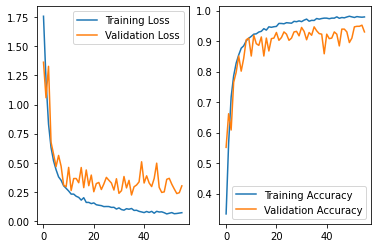

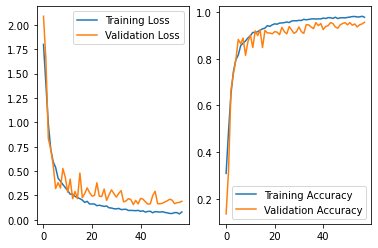

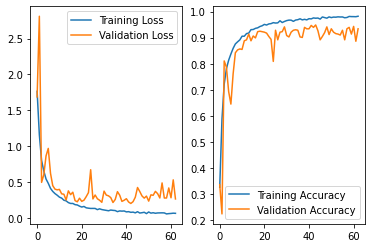

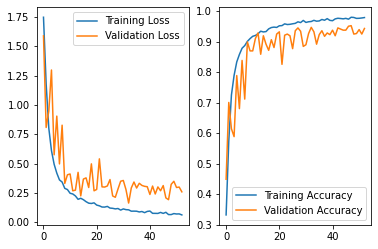

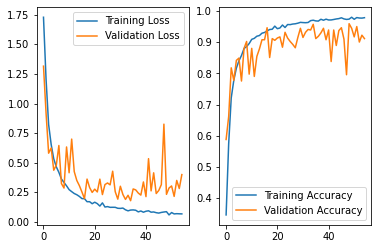

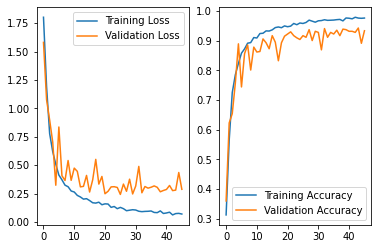

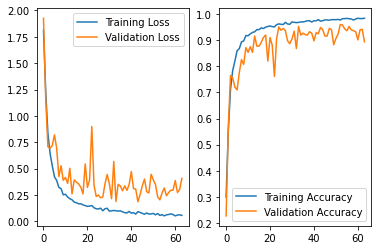

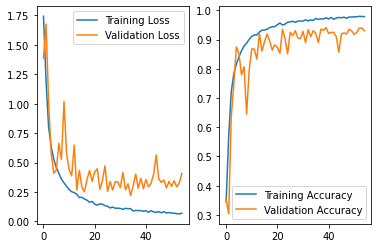

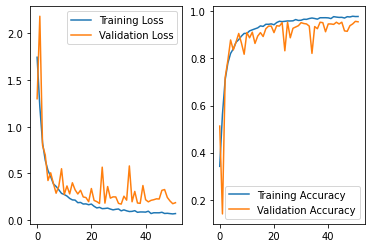

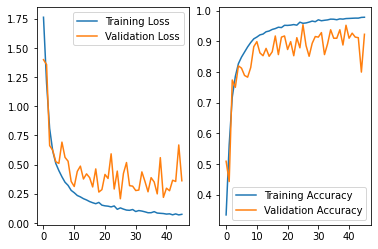

In [22]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [23]:
print_metrics(kFold_metrics)


precision mean by class [1.         0.89947497 0.85680653 0.92017387 0.98432344 0.94212771
 0.72640762 0.91731692]
precision sdev by class [0.         0.08828134 0.12038785 0.04558558 0.01642739 0.03416107
 0.10631193 0.04301204]
macro precision mean 0.9058288827126637
macro precision sdev 0.020361581066560098
recall mean [0.9        0.96025641 0.75833333 0.92954023 0.96036    0.92179487
 0.86858974 0.95530488]
recall sdev [0.21343747 0.05261099 0.05930904 0.04647731 0.01703697 0.05870069
 0.0979008  0.03809395]
macro recall mean 0.906772433724249
macro recall sdev 0.034493176915575796
f1 mean [0.93       0.92581268 0.79697373 0.92357426 0.97201204 0.92983278
 0.78638338 0.93450952]
f1 sdev [0.15524175 0.05436144 0.05578622 0.03076887 0.01039591 0.02497881
 0.08605137 0.01973851]
macro f1 mean 0.8998872982953083
macro f1 sdev 0.03126461049784316
accuracy mean 0.9413401245297133
accuracy sdev 0.013885550488363149


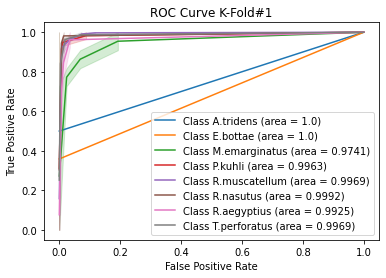

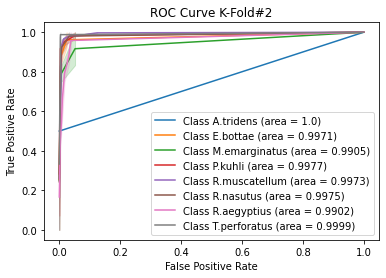

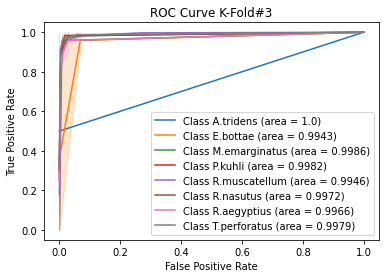

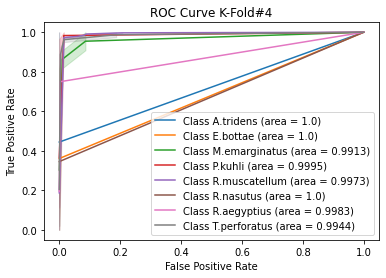

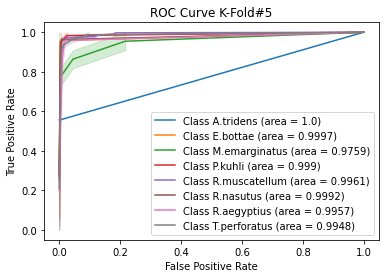

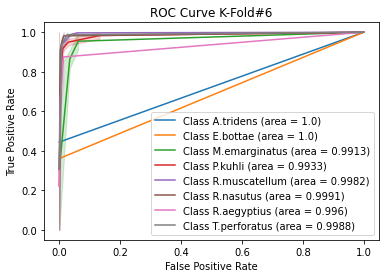

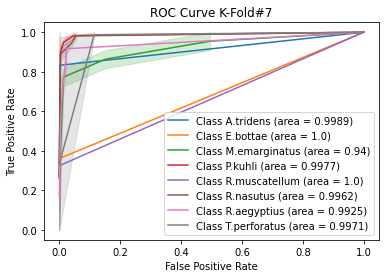

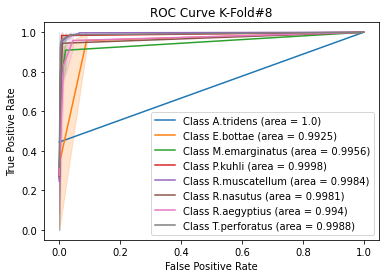

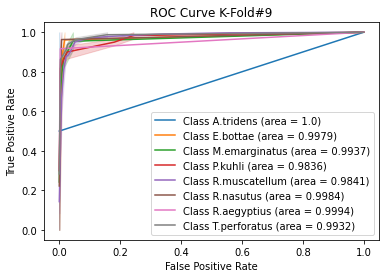

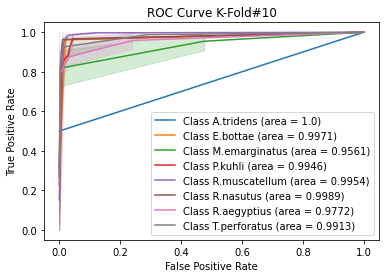

In [24]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [25]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.9998885172798216
Std  0.0003344481605351057
Sp:  E.bottae
AUC Mean  0.9978491598569006
Std  0.002538520424757616
Sp:  M.emarginatus
AUC Mean  0.9807089918021307
Std  0.018321657852746292
Sp:  P.kuhli
AUC Mean  0.9959614798232662
Std  0.004562321540497235
Sp:  R.muscatellum
AUC Mean  0.9958375408015374
Std  0.004174822309565597
Sp:  R.nasutus
AUC Mean  0.9983744434391847
Std  0.0010787917617409322
Sp:  R.aegyptius
AUC Mean  0.9932409234562917
Std  0.005960338966140385
Sp:  T.perforatus
AUC Mean  0.9963123648642382
Std  0.0026363319175092834


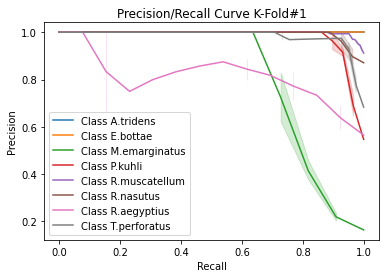

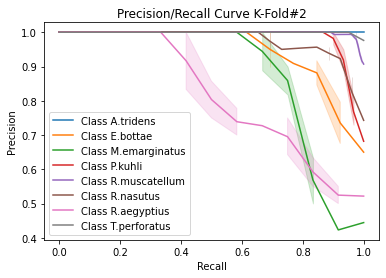

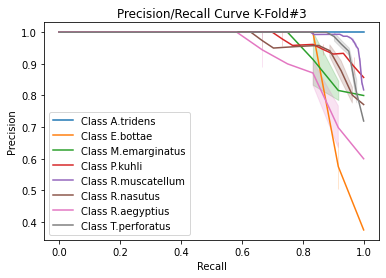

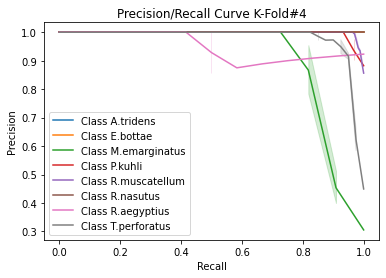

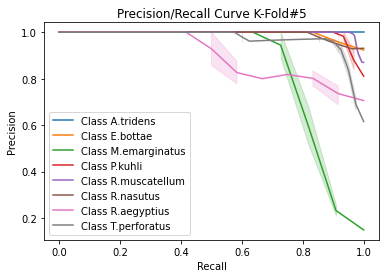

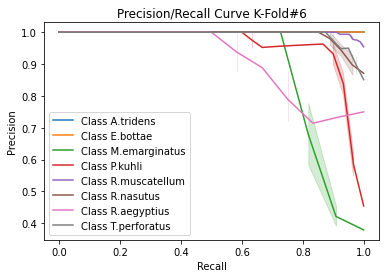

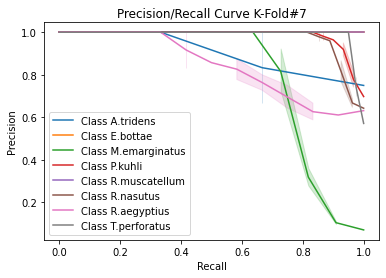

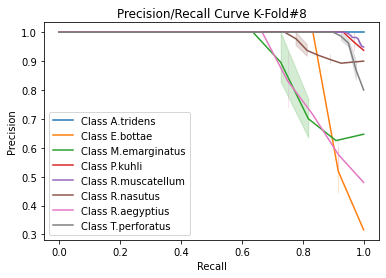

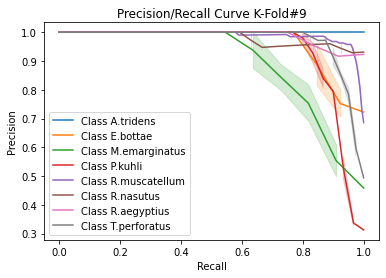

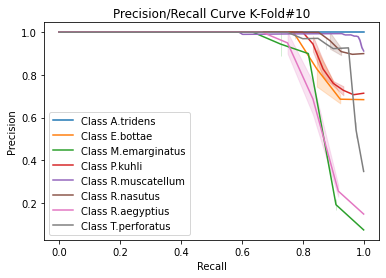

In [26]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  2   0   0   0   0   0   0   0]
 [  0  13   0   0   0   0   0   0]
 [  0   0   8   0   1   0   2   0]
 [  0   0   1  25   2   0   1   0]
 [  0   0   0   0 163   3   0   0]
 [  0   0   0   0   0  26   1   0]
 [  0   0   1   0   1   0  10   1]
 [  0   0   0   0   4   0   0  37]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  12   0   0   1   0   0   0]
 [  0   0   9   0   0   0   2   1]
 [  0   0   0  28   0   1   1   0]
 [  0   1   0   0 161   0   2   2]
 [  0   1   1   1   0  23   0   0]
 [  0   1   0   0   1   0  10   0]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   1   0   0]
 [  0   0  10   0   1   0   1   0]
 [  0   0   0  29   0   1   0   0]
 [  0   0   0   2 159   0   2   3]
 [  0   0   0   0   1  25   1   0]
 [  0   0   1   0   0   0  11   0]
 [  0   0   0   0   0   0   1  40]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

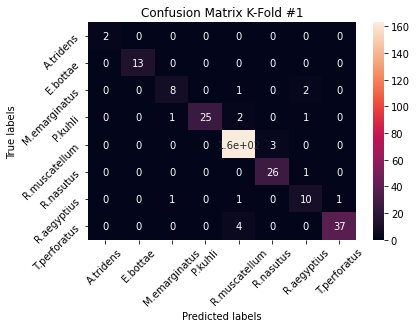

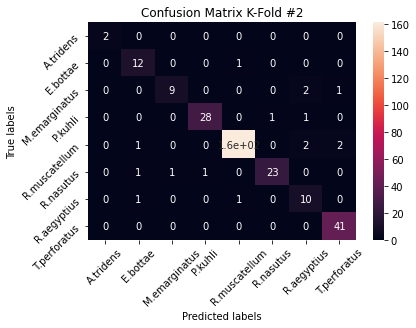

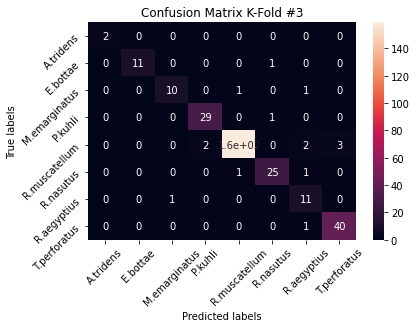

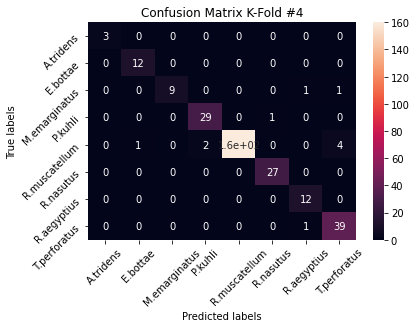

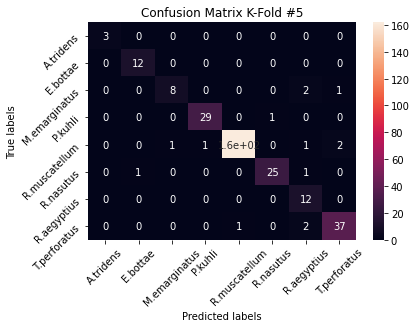

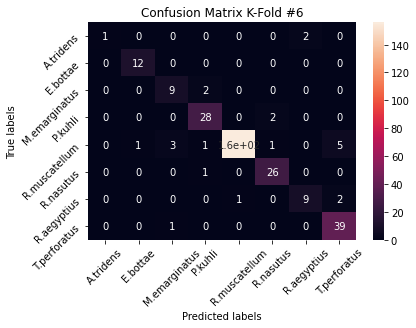

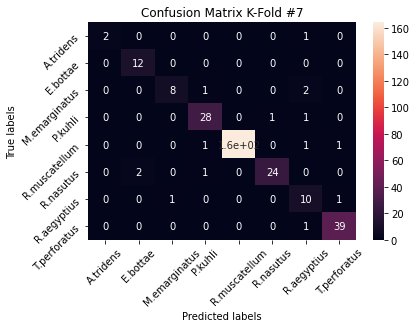

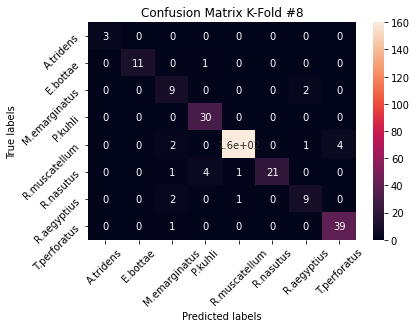

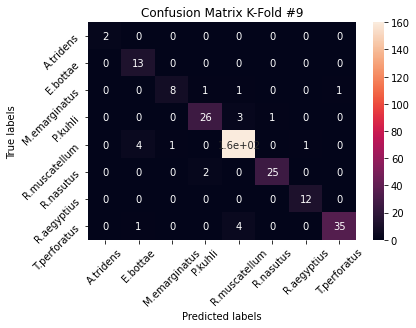

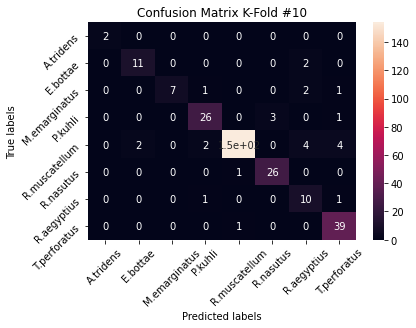

In [27]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  22    0    0    0    0    0    3    0]
 [   0  119    0    1    1    1    2    0]
 [   0    0   85    5    3    0   14    5]
 [   0    0    1  278    5   11    3    1]
 [   0    9    7    9 1599    4   12   25]
 [   0    4    2    9    3  248    3    0]
 [   0    1    5    1    4    0  105    5]
 [   0    1    2    0   10    0    5  385]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   8   0   0   0   1   0]
 [  0   0   0  27   0   1   0   0]
 [  0   0   0   0 159   0   1   2]
 [  0   0   0   0   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   0  38]]


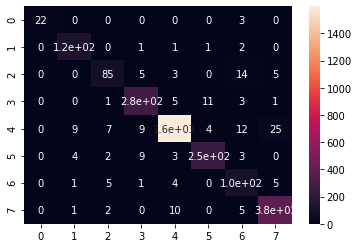

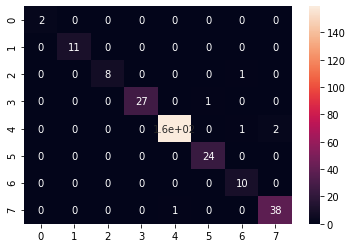

In [28]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.88 0.   0.   0.   0.   0.   0.12 0.  ]
 [0.   0.96 0.   0.01 0.01 0.01 0.02 0.  ]
 [0.   0.   0.76 0.04 0.03 0.   0.12 0.04]
 [0.   0.   0.   0.93 0.02 0.04 0.01 0.  ]
 [0.   0.01 0.   0.01 0.96 0.   0.01 0.02]
 [0.   0.01 0.01 0.03 0.01 0.92 0.01 0.  ]
 [0.   0.01 0.04 0.01 0.03 0.   0.87 0.04]
 [0.   0.   0.   0.   0.02 0.   0.01 0.96]]


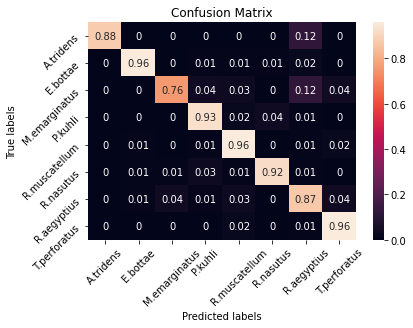

In [29]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)

# V6 Re-Load Data

In [30]:
folder = "models"
mode_version = "spec_RO_v6"
mode_version = os.path.join(folder, mode_version)

print(mode_version)

models/spec_RO_v6


In [31]:
X_all = []
Y_all = []

image_folder_path = '../data/MFCC2'
file_paths = [f for f in os.listdir(image_folder_path)]

for file_name in file_paths:
    spectrogram = Image.open(image_folder_path + '/' + file_name)
    spectrogram = spectrogram.convert('RGB')
    spectrogram = spectrogram.resize((85, 56))  
    spectrogram = np.array(spectrogram)
    #spectrogram = np.expand_dims(spectrogram, axis=2) 
    X_all.append(spectrogram)
    Y_all.append(getSpeciesCode(file_name))


In [32]:
X_all = np.array(X_all)
Y_all = np.array(Y_all)

print(X_all.shape)
print(Y_all.shape)

X_all = X_all.astype('float32')
X_all /= 255

Y_all = np_utils.to_categorical(Y_all, num_classes=8) 


(3018, 56, 85, 3)
(3018,)


In [33]:
def build_current_model():
    inp = Input(shape=(56,85,3))
    lay = Convolution2D(filters=168,kernel_size=(7,7),strides=(2,2),padding='same')(inp)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = MaxPooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.2)(lay)

    lay = Convolution2D(filters=56,kernel_size=(7,7),strides=(2,2),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=232,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.3)(lay)

    lay = Convolution2D(filters=104,kernel_size=(5,5),strides=(1,1),padding='same')(lay)
    lay = BatchNormalization()(lay)
    lay = Activation('relu')(lay)
    lay = AveragePooling2D(pool_size=(2,2),strides=2,padding='same')(lay)
    lay = Dropout(0.4)(lay)

    lay = Flatten()(lay)

    x_out = Dense(8, name='output', activation='softmax')(lay)
    model = Model(inputs=inp, outputs=x_out)
    model.compile(
        optimizer=Adam(lr=0.003),
        loss='categorical_crossentropy',
        metrics=['accuracy']
    )
    return model



In [34]:
model = build_current_model()
model.summary()

Model: "model_11"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_12 (InputLayer)        [(None, 56, 85, 3)]       0         
_________________________________________________________________
conv2d_44 (Conv2D)           (None, 28, 43, 168)       24864     
_________________________________________________________________
batch_normalization_66 (Batc (None, 28, 43, 168)       672       
_________________________________________________________________
activation_66 (Activation)   (None, 28, 43, 168)       0         
_________________________________________________________________
max_pooling2d_11 (MaxPooling (None, 14, 22, 168)       0         
_________________________________________________________________
dropout_22 (Dropout)         (None, 14, 22, 168)       0         
_________________________________________________________________
conv2d_45 (Conv2D)           (None, 7, 11, 56)         461

In [35]:
kFold_train(X_all,Y_all, mode_version)
               

Original training set shape [('R.muscatellum', 1199), ('E.bottae', 89), ('R.nasutus', 194), ('R.aegyptius', 86), ('T.perforatus', 289), ('P.kuhli', 216), ('A.tridens', 18), ('M.emarginatus', 81)]
Resampled training set shape [('R.muscatellum', 1199), ('E.bottae', 1199), ('R.nasutus', 1199), ('R.aegyptius', 1199), ('T.perforatus', 1199), ('P.kuhli', 1199), ('A.tridens', 1199), ('M.emarginatus', 1199)]
After OverSampling
X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 13s - loss: 1.4462 - acc: 0.4638 - val_loss: 2.1684 - val_acc: 0.3162
Epoch 2/100
9592/9592 - 11s - loss: 0.7329 - acc: 0.7393 - val_loss: 0.8247 - val_acc: 0.6893
Epoch 3/100
9592/9592 - 11s - loss: 0.4984 - acc: 0.8280 - val_loss: 1.1888 - val_acc: 0.5368
Epoch 4/100
9592/9592 - 10s - loss: 0.3780 - acc: 0.8658 - val_loss: 0.5912 - val_acc: 0.8199
Epoch 5/100
9592/9592 - 10s - loss: 0.3117 - acc: 0.8916 - val_loss: 0.5194 - val_acc: 0.830

Epoch 38/100
9592/9592 - 10s - loss: 0.0520 - acc: 0.9825 - val_loss: 0.2694 - val_acc: 0.9393
Epoch 39/100
9592/9592 - 10s - loss: 0.0601 - acc: 0.9807 - val_loss: 0.1885 - val_acc: 0.9522
Epoch 40/100
9592/9592 - 11s - loss: 0.0513 - acc: 0.9822 - val_loss: 0.3279 - val_acc: 0.9118
Epoch 41/100
9592/9592 - 11s - loss: 0.0478 - acc: 0.9835 - val_loss: 0.3202 - val_acc: 0.9173
Epoch 42/100
9592/9592 - 10s - loss: 0.0506 - acc: 0.9834 - val_loss: 0.3239 - val_acc: 0.9099
Epoch 43/100
9592/9592 - 11s - loss: 0.0440 - acc: 0.9861 - val_loss: 0.2805 - val_acc: 0.9338
Epoch 44/100
9592/9592 - 11s - loss: 0.0513 - acc: 0.9832 - val_loss: 0.2926 - val_acc: 0.9467
Epoch 45/100
9592/9592 - 10s - loss: 0.0440 - acc: 0.9855 - val_loss: 0.3029 - val_acc: 0.9301
Epoch 46/100
9592/9592 - 11s - loss: 0.0543 - acc: 0.9821 - val_loss: 0.2499 - val_acc: 0.9412
Epoch 47/100
9592/9592 - 11s - loss: 0.0377 - acc: 0.9879 - val_loss: 0.2362 - val_acc: 0.9393
Epoch 48/100
9592/9592 - 10s - loss: 0.0413 - acc:

Epoch 7/100
9584/9584 - 10s - loss: 0.2117 - acc: 0.9262 - val_loss: 0.7294 - val_acc: 0.7151
Epoch 8/100
9584/9584 - 11s - loss: 0.1843 - acc: 0.9357 - val_loss: 0.4153 - val_acc: 0.8640
Epoch 9/100
9584/9584 - 11s - loss: 0.1719 - acc: 0.9424 - val_loss: 0.6214 - val_acc: 0.8033
Epoch 10/100
9584/9584 - 11s - loss: 0.1443 - acc: 0.9527 - val_loss: 0.6641 - val_acc: 0.7794
Epoch 11/100
9584/9584 - 11s - loss: 0.1357 - acc: 0.9523 - val_loss: 0.2745 - val_acc: 0.9044
Epoch 12/100
9584/9584 - 11s - loss: 0.1289 - acc: 0.9590 - val_loss: 0.3001 - val_acc: 0.9081
Epoch 13/100
9584/9584 - 11s - loss: 0.1288 - acc: 0.9559 - val_loss: 0.3225 - val_acc: 0.8915
Epoch 14/100
9584/9584 - 11s - loss: 0.1098 - acc: 0.9621 - val_loss: 0.8080 - val_acc: 0.7537
Epoch 15/100
9584/9584 - 11s - loss: 0.1119 - acc: 0.9609 - val_loss: 0.3299 - val_acc: 0.9026
Epoch 16/100
9584/9584 - 11s - loss: 0.0956 - acc: 0.9673 - val_loss: 0.3528 - val_acc: 0.8879
Epoch 17/100
9584/9584 - 11s - loss: 0.0938 - acc: 0.

Epoch 00031: early stopping
models/spec_RO_v6_iter_5.model
Original training set shape [('T.perforatus', 290), ('R.muscatellum', 1198), ('E.bottae', 90), ('R.aegyptius', 87), ('P.kuhli', 215), ('R.nasutus', 193), ('M.emarginatus', 81), ('A.tridens', 18)]
Resampled training set shape [('T.perforatus', 1198), ('R.muscatellum', 1198), ('E.bottae', 1198), ('R.aegyptius', 1198), ('P.kuhli', 1198), ('R.nasutus', 1198), ('M.emarginatus', 1198), ('A.tridens', 1198)]
After OverSampling
X_train: shape=  (9584, 56, 85, 3)
Y_train: shape=  (9584, 8)
Train on 9584 samples, validate on 544 samples
Epoch 1/100
9584/9584 - 14s - loss: 1.4398 - acc: 0.4646 - val_loss: 1.0845 - val_acc: 0.6085
Epoch 2/100
9584/9584 - 13s - loss: 0.6685 - acc: 0.7627 - val_loss: 1.1462 - val_acc: 0.5092
Epoch 3/100
9584/9584 - 12s - loss: 0.4556 - acc: 0.8396 - val_loss: 0.4922 - val_acc: 0.8419
Epoch 4/100
9584/9584 - 13s - loss: 0.3437 - acc: 0.8799 - val_loss: 0.7358 - val_acc: 0.7665
Epoch 5/100
9584/9584 - 12s - los

Epoch 8/100
9584/9584 - 12s - loss: 0.1872 - acc: 0.9374 - val_loss: 0.7467 - val_acc: 0.7574
Epoch 9/100
9584/9584 - 13s - loss: 0.1708 - acc: 0.9442 - val_loss: 0.3930 - val_acc: 0.8676
Epoch 10/100
9584/9584 - 12s - loss: 0.1436 - acc: 0.9532 - val_loss: 0.4639 - val_acc: 0.8511
Epoch 11/100
9584/9584 - 13s - loss: 0.1379 - acc: 0.9524 - val_loss: 0.7631 - val_acc: 0.7702
Epoch 12/100
9584/9584 - 13s - loss: 0.1326 - acc: 0.9551 - val_loss: 0.5080 - val_acc: 0.8474
Epoch 13/100
9584/9584 - 13s - loss: 0.1178 - acc: 0.9616 - val_loss: 1.6570 - val_acc: 0.6121
Epoch 14/100
9584/9584 - 12s - loss: 0.1124 - acc: 0.9633 - val_loss: 0.5641 - val_acc: 0.8199
Epoch 15/100
9584/9584 - 13s - loss: 0.0977 - acc: 0.9664 - val_loss: 0.5350 - val_acc: 0.8732
Epoch 16/100
9584/9584 - 12s - loss: 0.1038 - acc: 0.9648 - val_loss: 0.4404 - val_acc: 0.8658
Epoch 17/100
9584/9584 - 13s - loss: 0.0920 - acc: 0.9698 - val_loss: 0.6037 - val_acc: 0.8456
Epoch 18/100
9584/9584 - 13s - loss: 0.0880 - acc: 0

Epoch 16/100
9584/9584 - 11s - loss: 0.1087 - acc: 0.9637 - val_loss: 0.3764 - val_acc: 0.8897
Epoch 17/100
9584/9584 - 11s - loss: 0.0998 - acc: 0.9653 - val_loss: 0.2574 - val_acc: 0.9210
Epoch 18/100
9584/9584 - 11s - loss: 0.1048 - acc: 0.9642 - val_loss: 0.4258 - val_acc: 0.8695
Epoch 19/100
9584/9584 - 11s - loss: 0.0850 - acc: 0.9695 - val_loss: 0.3000 - val_acc: 0.9026
Epoch 20/100
9584/9584 - 11s - loss: 0.0860 - acc: 0.9693 - val_loss: 0.4146 - val_acc: 0.8842
Epoch 21/100
9584/9584 - 11s - loss: 0.0796 - acc: 0.9740 - val_loss: 1.0479 - val_acc: 0.7426
Epoch 22/100
9584/9584 - 11s - loss: 0.0789 - acc: 0.9735 - val_loss: 0.2462 - val_acc: 0.9338
Epoch 23/100
9584/9584 - 11s - loss: 0.0780 - acc: 0.9743 - val_loss: 0.2042 - val_acc: 0.9375
Epoch 24/100
9584/9584 - 11s - loss: 0.0743 - acc: 0.9776 - val_loss: 0.2334 - val_acc: 0.9283
Epoch 25/100
9584/9584 - 12s - loss: 0.0717 - acc: 0.9767 - val_loss: 0.3991 - val_acc: 0.8695
Epoch 26/100
9584/9584 - 11s - loss: 0.0623 - acc:

X_train: shape=  (9592, 56, 85, 3)
Y_train: shape=  (9592, 8)
Train on 9592 samples, validate on 544 samples
Epoch 1/100
9592/9592 - 13s - loss: 1.5316 - acc: 0.4290 - val_loss: 1.2840 - val_acc: 0.5772
Epoch 2/100
9592/9592 - 11s - loss: 0.7044 - acc: 0.7485 - val_loss: 0.7800 - val_acc: 0.7279
Epoch 3/100
9592/9592 - 10s - loss: 0.4640 - acc: 0.8400 - val_loss: 1.1712 - val_acc: 0.6875
Epoch 4/100
9592/9592 - 10s - loss: 0.3610 - acc: 0.8750 - val_loss: 0.5780 - val_acc: 0.7702
Epoch 5/100
9592/9592 - 11s - loss: 0.2834 - acc: 0.9050 - val_loss: 0.5715 - val_acc: 0.7831
Epoch 6/100
9592/9592 - 11s - loss: 0.2384 - acc: 0.9182 - val_loss: 0.3698 - val_acc: 0.8713
Epoch 7/100
9592/9592 - 11s - loss: 0.2180 - acc: 0.9244 - val_loss: 0.4579 - val_acc: 0.8382
Epoch 8/100
9592/9592 - 10s - loss: 0.1863 - acc: 0.9361 - val_loss: 0.3743 - val_acc: 0.8787
Epoch 9/100
9592/9592 - 11s - loss: 0.1608 - acc: 0.9458 - val_loss: 0.5596 - val_acc: 0.8070
Epoch 10/100
9592/9592 - 11s - loss: 0.1677 -

In [36]:
kFold_metrics=kFold_test(X_all,Y_all, mode_version)

File Name Loaded:  models/spec_RO_v6_iter_1.model
File Name Loaded:  models/spec_RO_v6_iter_2.model
File Name Loaded:  models/spec_RO_v6_iter_3.model
File Name Loaded:  models/spec_RO_v6_iter_4.model
File Name Loaded:  models/spec_RO_v6_iter_5.model
File Name Loaded:  models/spec_RO_v6_iter_6.model
File Name Loaded:  models/spec_RO_v6_iter_7.model
File Name Loaded:  models/spec_RO_v6_iter_8.model
File Name Loaded:  models/spec_RO_v6_iter_9.model
File Name Loaded:  models/spec_RO_v6_iter_10.model


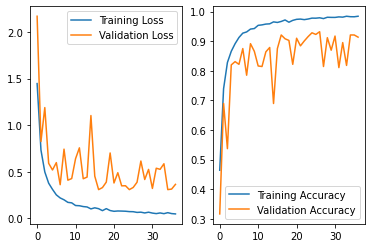

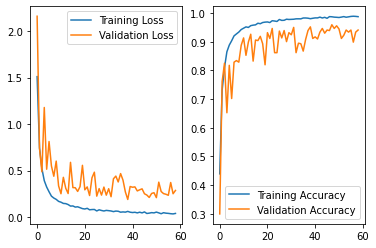

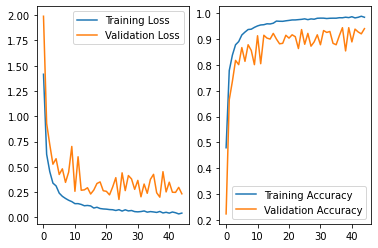

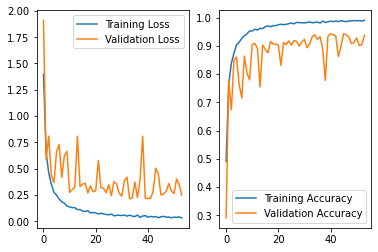

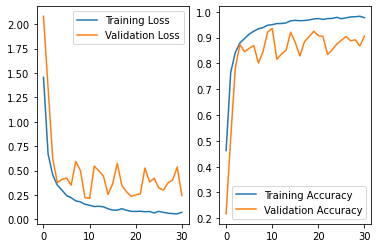

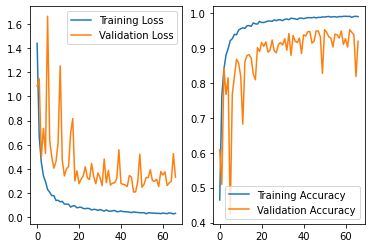

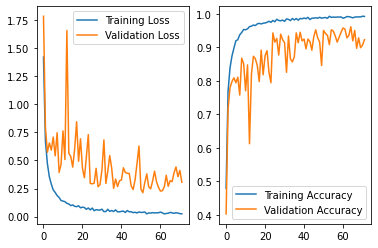

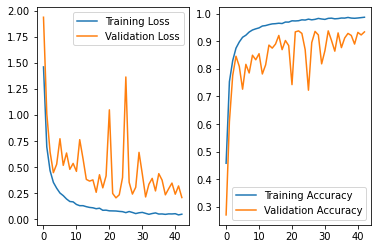

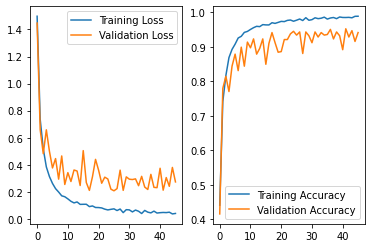

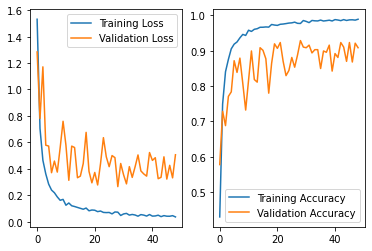

In [37]:
# print(KFold_metrics.get("all_df"))
plot_loss_Accuracy(kFold_metrics.get("all_df"))

In [38]:
print_metrics(kFold_metrics)


precision mean by class [1.         0.868663   0.86515873 0.86776744 0.97722569 0.91201963
 0.66008888 0.89785167]
precision sdev by class [0.         0.13660152 0.15966015 0.06010875 0.01256804 0.06032464
 0.10595724 0.05928331]
macro precision mean 0.8810968799193519
macro precision sdev 0.03482969307184658
recall mean [0.81666667 0.88910256 0.69545455 0.92287356 0.94655508 0.9034188
 0.84423077 0.92542683]
recall sdev [0.28333333 0.07063218 0.12497934 0.0454436  0.01769708 0.04109779
 0.09011143 0.06482602]
macro recall mean 0.8679661029957382
macro recall sdev 0.044722016951780914
f1 mean [0.86666667 0.86929893 0.7627438  0.89227059 0.96151284 0.90559036
 0.73812089 0.91077624]
f1 sdev [0.2081666  0.07386839 0.1263348  0.02988322 0.01066885 0.02591856
 0.09202486 0.05703925]
macro f1 mean 0.8633725395147025
macro f1 sdev 0.03883521447289725
accuracy mean 0.9204769972057821
accuracy sdev 0.018082718998755177


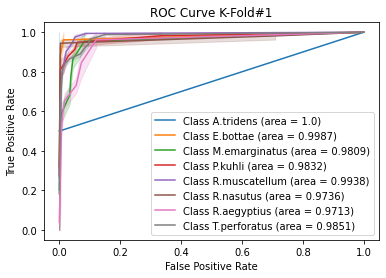

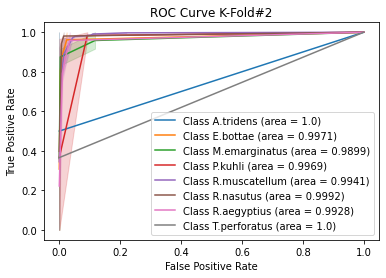

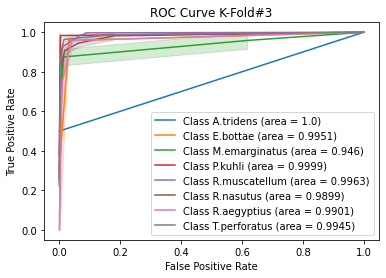

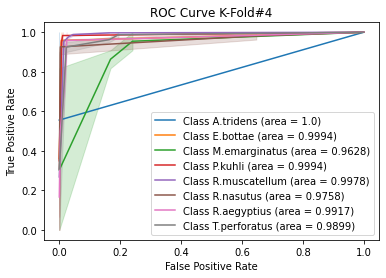

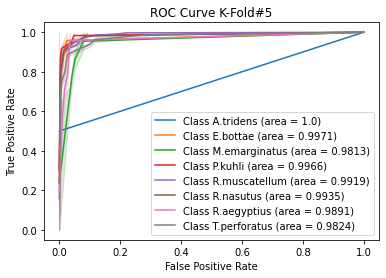

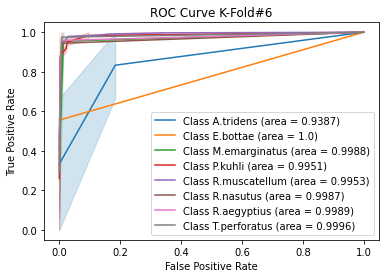

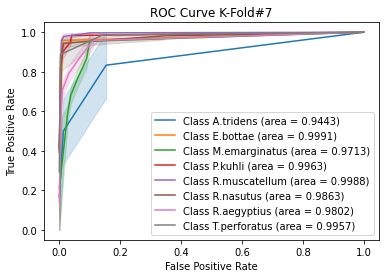

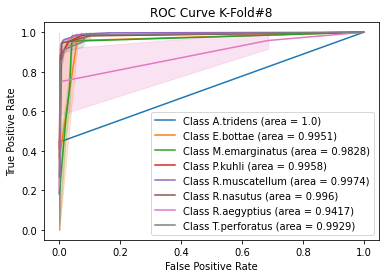

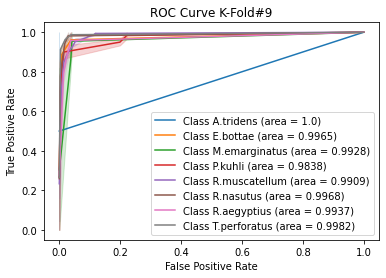

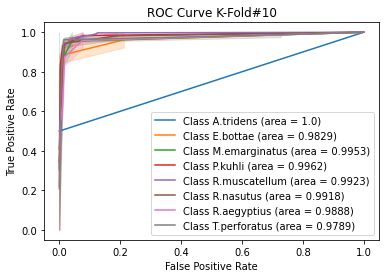

In [39]:
plot_ROC(kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


In [40]:
print_meanAUC (kFold_metrics.get("all_fpr"),kFold_metrics.get("all_tpr"))


Sp:  A.tridens
AUC Mean  0.9882943143812708
Std  0.023444527140259862
Sp:  E.bottae
AUC Mean  0.996109458385216
Std  0.004693618788120386
Sp:  M.emarginatus
AUC Mean  0.9801857986189659
Std  0.015450177121574982
Sp:  P.kuhli
AUC Mean  0.9943176016650555
Std  0.00560294499762458
Sp:  R.muscatellum
AUC Mean  0.9948579441636454
Std  0.0025683688719376602
Sp:  R.nasutus
AUC Mean  0.9901344321487132
Std  0.008608751821413149
Sp:  R.aegyptius
AUC Mean  0.983800335159809
Std  0.0158258438432618
Sp:  T.perforatus
AUC Mean  0.9917326954889711
Std  0.007028978022900579


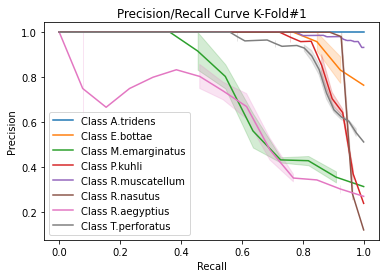

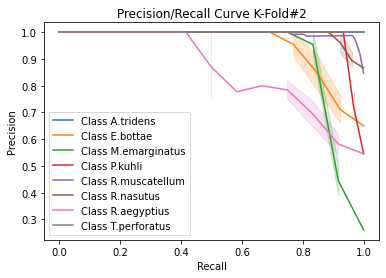

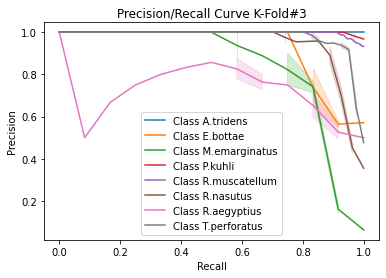

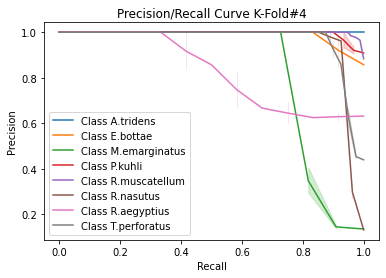

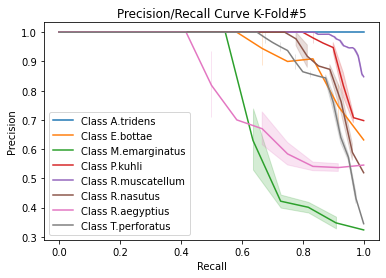

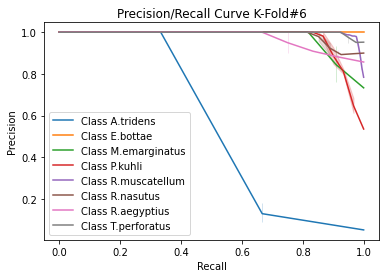

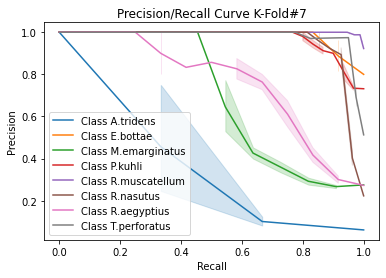

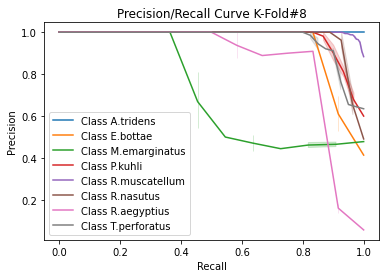

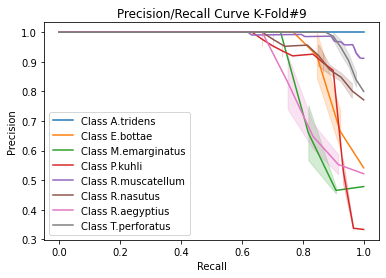

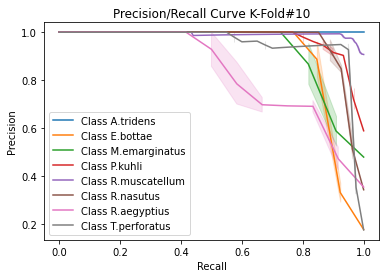

In [41]:
plot_precision_recall(kFold_metrics.get("all_recall"),kFold_metrics.get("all_precision"))
                   

Confusion Matrix K-Fold #1

[[  1   0   0   0   0   0   0   1]
 [  0  11   0   0   1   1   0   0]
 [  0   0   6   1   0   0   3   1]
 [  0   0   0  25   2   0   1   1]
 [  0   0   1   1 160   0   2   2]
 [  0   0   0   1   0  25   1   0]
 [  0   0   0   0   1   0   9   3]
 [  0   0   1   0   4   0   1  35]]


Confusion Matrix K-Fold #2

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   1   2   0   0]
 [  0   0   9   2   0   0   1   0]
 [  0   0   0  29   1   0   0   0]
 [  0   0   0   2 159   0   2   3]
 [  0   0   0   2   0  24   0   0]
 [  0   0   0   0   0   0  10   2]
 [  0   0   0   0   0   0   0  41]]


Confusion Matrix K-Fold #3

[[  2   0   0   0   0   0   0   0]
 [  0  10   0   0   0   1   1   0]
 [  0   0   9   0   1   0   1   1]
 [  0   0   0  28   1   0   1   0]
 [  0   2   0   0 158   0   1   5]
 [  0   0   0   0   2  23   2   0]
 [  0   0   1   0   1   0  10   0]
 [  0   0   0   0   0   0   1  40]]


Confusion Matrix K-Fold #4

[[  3   0   0   0   0   0   0   0]
 [  

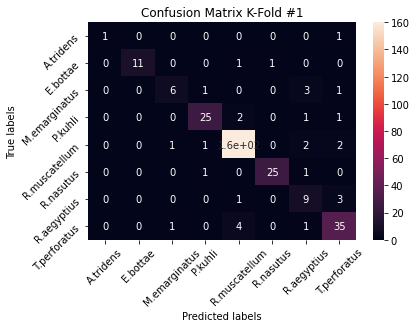

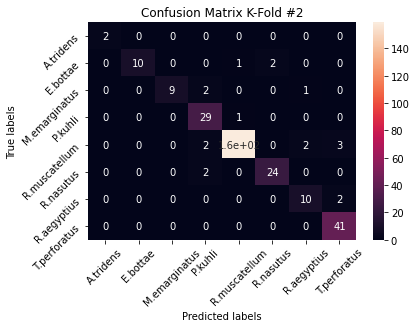

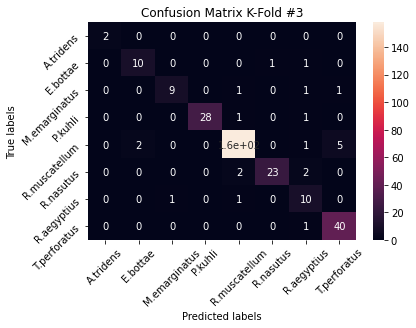

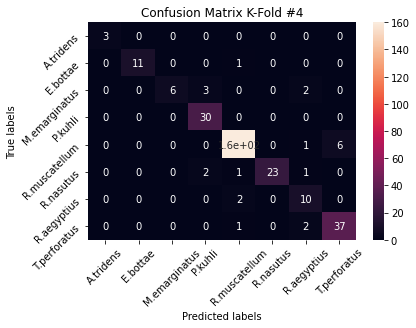

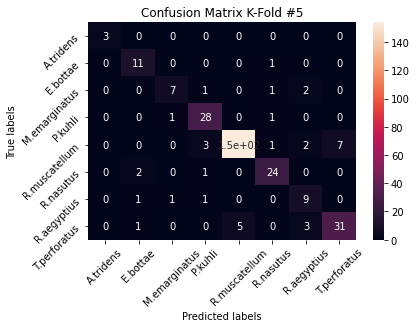

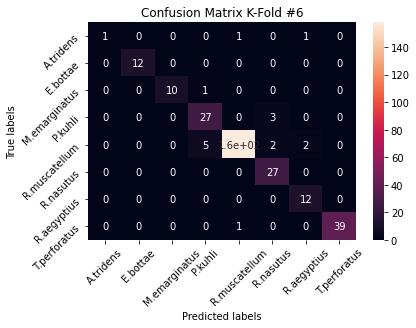

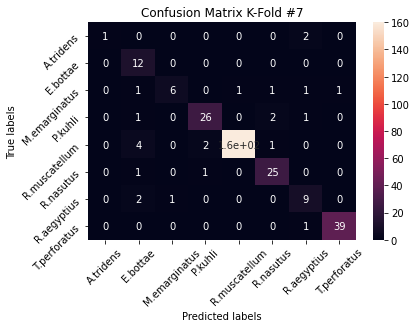

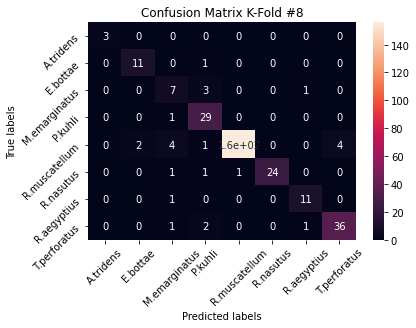

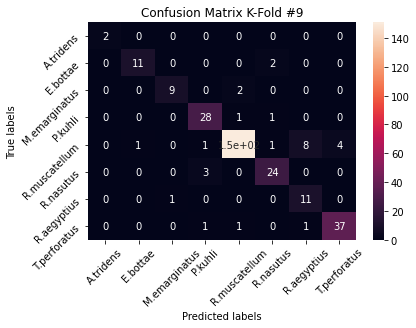

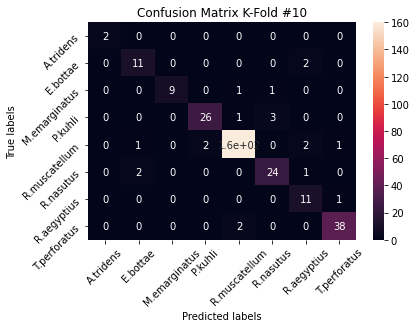

In [42]:
plot_confusion_matrices_per_iter(kFold_metrics.get("all_cm"))


sum of all confuion matrices
 [[  20    0    0    0    1    0    3    1]
 [   0  110    0    1    3    7    3    0]
 [   0    1   78   11    5    3   11    3]
 [   0    1    2  276    6   10    3    1]
 [   0   10    5   17 1576    5   20   32]
 [   0    5    1   11    4  243    5    0]
 [   0    3    5    1    4    0  102    6]
 [   0    1    2    3   14    0   10  373]]

average of all confuion matrices
 [[  2   0   0   0   0   0   0   0]
 [  0  11   0   0   0   0   0   0]
 [  0   0   7   1   0   0   1   0]
 [  0   0   0  27   0   1   0   0]
 [  0   1   0   1 157   0   2   3]
 [  0   0   0   1   0  24   0   0]
 [  0   0   0   0   0   0  10   0]
 [  0   0   0   0   1   0   1  37]]


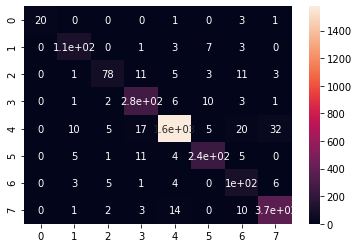

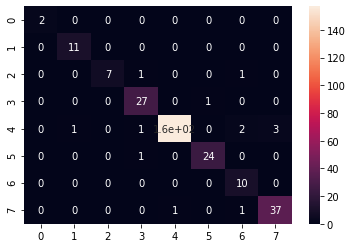

In [43]:
sum_all_cm, avg_all_cm=plot_macro_confusion_matrices(kFold_metrics.get("all_cm"))                   


[[0.8  0.   0.   0.   0.04 0.   0.12 0.04]
 [0.   0.89 0.   0.01 0.02 0.06 0.02 0.  ]
 [0.   0.01 0.7  0.1  0.04 0.03 0.1  0.03]
 [0.   0.   0.01 0.92 0.02 0.03 0.01 0.  ]
 [0.   0.01 0.   0.01 0.95 0.   0.01 0.02]
 [0.   0.02 0.   0.04 0.01 0.9  0.02 0.  ]
 [0.   0.02 0.04 0.01 0.03 0.   0.84 0.05]
 [0.   0.   0.   0.01 0.03 0.   0.02 0.93]]


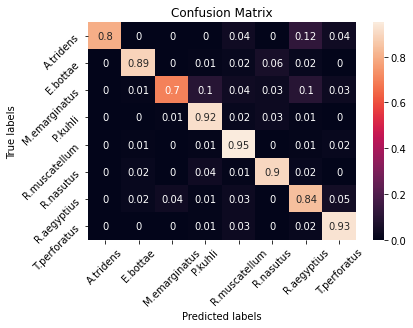

In [44]:
plot_normalised_confusion_matrix(sum_all_cm, avg_all_cm)